In [1]:
%matplotlib notebook

# allows for automatic reloading of imports and makes it unncessecary to restart the kernel
# whenever a function is changed
%load_ext autoreload
%autoreload 2


import os
import time
import numpy as np
import csv
import pandas as pd
import copy
from sklearn.cluster import KMeans

from tqdm import tqdm
import time
import math

import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from classes.Settings import Settings
from helpers.geometry_helpers import make_coordinate_df
from calc_density_4 import count_points_per_square

from helpers.plot_functions import plot_density, plot_fragment_colored, plot_vdw_spheres
from helpers.density_helpers import prepare_df, find_available_volume
from helpers.geometry_helpers import (make_coordinate_df,
                                      get_vdw_distance_contact)


central_groups = ["RCOMe", "RNO2", "ArCI", "NO3", "RC6F5", "H2O", "RC6H5"]
contact_groups = ["CF", "RCN", "R2CO", "XH", "XH", "CCH3", "C2CH2", "RC6H5", "ArCH"]  #
to_count =       ["F",   "N",    "O",   "H", "O",  "H",     "H", "centroid", "H"] #, 



In [2]:
def make_density_plot(avg_fragment, density_df, settings):
    fig = plt.figure()
    
    ax: Axes3D = fig.add_subplot(111, projection='3d')
    title_string = f"{settings.central_group_name}-{settings.contact_group_name} resolution: {settings.resolution: .2f}\
                     Interacting part of contact group: {to_count_contact}"
    ax.set_title(title_string.replace("", " "))
    
    ax = plot_fragment_colored(ax, avg_fragment)

    p, ax = plot_density(ax=ax, df=density_df, settings=settings)

    ax.set_title("4D density plot\n Resolution: " + str(settings.resolution))
    
    fig.colorbar(p)
    plt.savefig('results/directionality_tests/' + settings.central_group_name  + "/" + settings.central_group_name + "_" + settings.contact_group_name + "_1_resolution_" + str(settings.resolution) + '.png')
#     plt.close()

In [3]:
def calc_clusters(density_df, amount_of_clusters):
    to_cluster_df = density_df[density_df['to_cluster']]
    
    X = np.transpose(np.array([to_cluster_df.x_center, to_cluster_df.y_center, to_cluster_df.z_center]))

    kmeans = KMeans(n_clusters=amount_of_clusters, random_state=1)
    kmeans.fit(X)
    
    density_df.loc[density_df['to_cluster'], "cluster"] = kmeans.labels_
    
    return density_df, kmeans.cluster_centers_

In [4]:
def find_bins_to_cluster(settings, density_df, fraction):    
    density_df["x_center"] = density_df.xstart + 0.5 * settings.resolution
    density_df["y_center"] = density_df.ystart + 0.5 * settings.resolution
    density_df["z_center"] = density_df.zstart + 0.5 * settings.resolution
    
    # normalize
    density_df.loc[:, settings.to_count_contact + "_normalized"] =\
        density_df[settings.to_count_contact] / density_df[settings.to_count_contact].sum()

    # reset cluster color for when you run this cell again
    density_df["cluster_color"] = np.nan
    
    # set a threshold as to determine will belong to a cluster and which ones won't
    # get the upper kwartant
    max_bin = density_df[settings.to_count_contact].max()
    threshold = max_bin * fraction
    print("Threshold k-means:", threshold, "max_bin:", max_bin, "with fraction:", fraction)
  
    density_df["cluster"] = np.nan
    density_df["to_cluster"] = False
    density_df.loc[density_df[settings.to_count_contact] > threshold, 'to_cluster'] = True
    
    return density_df

In [5]:
def my_reduce(lst):
    if len(lst) == 1:
        return lst[0]
    elif len(lst) == 0:
        return []
    
    reduced_list = lst[0]
    for x in lst[1:]:
        reduced_list = reduced_list.append(x)

    reduced_list = reduced_list.drop_duplicates(keep='first')
    return reduced_list

    
def fill_holes(df, radius, column):
    amount = settings.to_count_contact
    unique_clusters = df.cluster.dropna().unique()
    
    for cluster_id in unique_clusters:
        # get all bins in the cluster

        cluster_indices = df.index[(df[column] == cluster_id)]   
        boundary_indices = []
    
        for _, row in df.loc[cluster_indices, :].iterrows():

            # get empty bins around cluster bins
            boundary_index = df.index[((df[column].isna()) &
                                         (np.sqrt((df.x_center - row.x_center)**2 +
                                            (df.y_center - row.y_center)**2 +
                                            (df.z_center - row.z_center)**2) <= radius))]
            
            boundary_indices.append(boundary_index)
        
        boundary_index = my_reduce(boundary_indices)
        
        
        while len(boundary_index) > 0:
            new_cluster_bins = []
            # count bins around these bins
            for i, emptyrow in df.loc[boundary_index, :].iterrows():
                index = df.index[((df[column] == cluster_id) & 
                                   (np.sqrt((df.x_center - emptyrow.x_center)**2 +
                                            (df.y_center - emptyrow.y_center)**2 +
                                            (df.z_center - emptyrow.z_center)**2) <= radius))]

                # if 3 or more neighbors are in the cluster, append
                if len(index) >= 3:
#                     print('Found a hole!')
                    df.loc[i, column] = cluster_id
                    
                    new_cluster_bins.append(i)
                                
            print('Added another:', len(new_cluster_bins))
            
            boundary_indices = []
            # check around the newly filled holes for boundary bins
            for _, row in df.loc[new_cluster_bins, :].iterrows():

                # get empty bins around cluster bins
                boundary_index = df.index[((df[column].isna()) &
                                             (np.sqrt((df.x_center - row.x_center)**2 +
                                            (df.y_center - row.y_center)**2 +
                                            (df.z_center - row.z_center)**2) <= radius))]

                boundary_indices.append(boundary_index)
        
            boundary_index = my_reduce(boundary_indices)
            print('Dit is de lijst van alex:', len(boundary_index))
                                    
    return df

In [6]:
def expand_clusters(df, new_indices, fraction, cluster_id, column_name, settings):
    # always look only 1 bin further
    radius = settings.resolution
    
    # while new bins that belong to the cluster are found, keep expanding
    while new_indices:
        old_length = len(df[df[column_name] == cluster_id])

        indices = []

        for new_index in new_indices:

            for _, row in df.loc[new_index, :].iterrows():
                index = df.index[((df[column_name].isna()) &
                                 (df.x_center >= row.x_center - radius) & (df.x_center <= row.x_center + radius) & 
                                 (df.y_center >= row.y_center - radius) & (df.y_center <= row.y_center + radius) &
                                 (df.z_center >= row.z_center - radius) & (df.z_center <= row.z_center + radius) &
                                 (df[settings.to_count_contact] > fraction))]

                indices.append(index)

                df.loc[index, column_name] = cluster_id

        new_indices = indices
        
        print(f"Added {len(indices)} new bins")
        
    return df

In [7]:
def recluster0(df, settings, recluster_frac):
    amount = settings.to_count_contact
    
    unique_clusters = df.cluster.dropna().unique()

    df["new_cluster0"] = np.nan
    
    for cluster_id in unique_clusters:
        
        # local maximum
        max_bin = df[df.cluster == cluster_id][amount].max()
        
        fraction = max_bin * recluster_frac
        print("Cluster id: " + str(cluster_id), " max bin: " + str(max_bin) + " fraction for this bin: ", fraction)
        
        new_indices = []
        # starting bin is only fullest bin(s)
        index = df.index[((df.cluster == cluster_id) & (df[amount] == max_bin))]
        df.loc[index, "new_cluster0"] = cluster_id      
        
        new_indices.append(index)
                
        # expand clusters
        df = expand_clusters(df, new_indices, fraction, cluster_id, 'new_cluster0', settings)
        
    return df

In [8]:
def recluster1(df, settings, recluster_frac):
    amount = settings.to_count_contact
    
    unique_clusters = df.cluster.dropna().unique()

    df["new_cluster1"] = np.nan
    
    for cluster_id in unique_clusters:
        
        # local maximum
        max_bin = df[df.cluster == cluster_id][amount].max()      
        fraction = max_bin * recluster_frac
        
        print("Cluster id: " + str(cluster_id), " max bin: " + str(max_bin) + " fraction for this bin: ", fraction)
        
        new_indices = []
        # put bins from K-means that are fuller then LOCAL threshold 
        index = df.index[((df.cluster == cluster_id) & (df[amount] >= fraction))]
        df.loc[index, "new_cluster1"] = cluster_id      
        
        new_indices.append(index)
                                    
        # expand clusters
        df = expand_clusters(df, new_indices, fraction, cluster_id, 'new_cluster1', settings)
        
    return df

In [9]:
def recluster2(df, settings, recluster_frac):
    amount = settings.to_count_contact
    
    unique_clusters = df.cluster.dropna().unique()
    
    # global maximum
    global_max = df[amount].max()
    fraction = global_max * recluster_frac

    df["new_cluster2"] = np.nan
    
    for cluster_id in unique_clusters:
        
        max_bin = df[df.cluster == cluster_id][amount].max()
        print("Cluster id: " + str(cluster_id), " max bin: " + str(max_bin) + " fraction for this bin: ", fraction)
        
        new_indices = []
        # start only with fullest bin per cluster
        index = df.index[((df.cluster == cluster_id) & (df[amount] == max_bin))]
        df.loc[index, "new_cluster2"] = cluster_id      
        
        new_indices.append(index)
                    
        # expand clusters
        df = expand_clusters(df, new_indices, fraction, cluster_id, 'new_cluster2', settings)
            
    return df

In [10]:
def recluster3(df, settings, recluster_frac):
    amount = settings.to_count_contact
    
    unique_clusters = df.cluster.dropna().unique()
    
    # global maximum
    global_max = df[amount].max()
    fraction = global_max * recluster_frac

    df["new_cluster3"] = np.nan
    
    for cluster_id in unique_clusters:
        
        max_bin = df[df.cluster == cluster_id][amount].max()
        print("Cluster id: " + str(cluster_id), " max bin: " + str(max_bin) + " fraction for this bin: ", fraction)
        
        new_indices = []
        # start with points from KMEANS that are fuller then the TRESHOLD
        index = df.index[((df.cluster == cluster_id) & (df[amount] >= fraction))]
        df.loc[index, "new_cluster3"] = cluster_id      
        
        new_indices.append(index)
                    
        # expand clusters
        df = expand_clusters(df, new_indices, fraction, cluster_id, 'new_cluster3', settings)
            
    return df

In [11]:
def calc_directionality(settings, density_df, k, kmeans_frac, recluster_frac):
    cluster_count = 0

    # work only with bins that are >0.25*maximum full
    density_df = find_bins_to_cluster(settings=settings, density_df=density_df, fraction=kmeans_frac)

    # calc for each bin in what cluster it belongs
    density_df, centroids = calc_clusters(density_df, k)
    density_df.drop(columns=["to_cluster"])
    
    # find the volume of the central group
    tolerance = 0.5

    df = pd.read_csv(settings.get_kabsch_aligned_csv_filename())
    avg_fragment = pd.read_csv(settings.get_avg_frag_filename())

    coordinate_df = make_coordinate_df(df, settings, avg_fragment)
    
    contact_group_radius = get_vdw_distance_contact(df, settings)
    available_volume = find_available_volume(avg_fragment=avg_fragment, extra=(tolerance + contact_group_radius))
    
#     print("\nRecluster method 0")
#     density_df = recluster0(density_df, settings, recluster_frac)

#     print("\nRecluster method 1")
#     density_df = recluster1(density_df, settings, recluster_frac)

#     print("\nRecluster method 2")
#     density_df = recluster2(density_df, settings, recluster_frac)
    
    print("\nRecluster method 3")
    density_df = recluster3(density_df, settings, recluster_frac)
        
    return density_df, centroids, available_volume

In [12]:
def show_directionality(avg_fragment, df, column, settings, available_volume, plt_name, kfrac):
    colors = ["red", "green", "blue", "purple", "yellow", "pink", "orange", "grey"]
    
    df["cluster_color"] = "grey"

    df.loc[df[column].notna(), "cluster_color"] = [colors[int(i)] for i in list(df.loc[df[column].notna(), column])]
    df = df[df[settings.to_count_contact + "_normalized"] > 0]

    fig = plt.figure(figsize=(8,8))
    ax: Axes3D = fig.add_subplot(111, projection='3d')

    rest = df[df.cluster_color != "grey"]
    
    clusters = df[column].dropna().unique()
    print(clusters)
    k = len(clusters)
    
    txt = "Available volume: + " + str(available_volume) + "\nClusters: " + str(k) + "\n"
    for cluster_id in clusters:
        points = df[df[column] == cluster_id]
        firstpoint = points.iloc[0]
        volume = len(points) * settings.resolution**3
        fraction = points[settings.to_count_contact + "_normalized"].sum()
        directionality = fraction/volume * available_volume
        
        with open('results/single_directionality.csv', 'a', newline='') as results:
            writer = csv.writer(results)
            writer.writerow([settings.central_group_name, settings.contact_group_name, settings.to_count_contact, 
                             settings.resolution, kfrac, column, directionality])
        
        ax.scatter(firstpoint.x_center, firstpoint.y_center, firstpoint.z_center,\
                    label="Cluster: " + str(cluster_id) + " Directionality:" + str(round(directionality, 2)),\
                    color=firstpoint.cluster_color)
        
        txt += 'id: ' + str(cluster_id) + ' vol: ' + str(round(volume,2)) + ' frac: ' + str(round(fraction,2)) + "\n"
            
    fig.text(.05,.05,txt)
    
    ax.scatter(list(rest.x_center), list(rest.y_center), list(rest.z_center),
               color=list(rest.cluster_color))
    
    # plot the average fragment
    ax = plot_fragment_colored(ax, avg_fragment)

    ax.set_title("Clusters " + settings.central_group_name + "-" + settings.contact_group_name + ", resolution: " + str(settings.resolution) + "\n" + column)
    
    ax.set_xlim(-6, 6)
    ax.set_ylim(-6, 6)
    
    ax.set_xlabel("X coordinate")
    ax.set_ylabel("Y coordinate")
    
    ax.legend(fontsize='x-small')
    
    elev = 89
    azim = -89
    ax.view_init(elev=elev, azim=azim)
    
    plt.show()
    
    plt.savefig(plt_name)
#     plt.close()

In [13]:
# for resolution 0.25
cluster_amount= 1

In [14]:
def get_plot_name(settings, column, cluster_amount, filledholes=False):
    k = cluster_amount
    if filledholes:
        string = f"results/single_cluster_directionality/{settings.central_group_name}/{settings.central_group_name}_\
                {settings.contact_group_name}_{settings.to_count_contact}_k{k}_resolution_{settings.resolution: .2f}\
                _{column}kfrac_{kfrac: .2f}_refrac_{recluster_frac: .2f}_filledholes.png"
    else:
        string = f"results/single_cluster_directionality/{settings.central_group_name}/{settings.central_group_name}_\
                  {settings.contact_group_name}_{settings.to_count_contact}_k{k}_resolution_{settings.resolution: .2f}\
                  _{column}kfrac_{kfrac: .2f}_refrac_{recluster_frac: .2f}.png"
            
    return string.replace(" ", "")

def get_cluster_plot_name(settings, column, cluster_amount):
    k = cluster_amount

    string = f'results/single_cluster_directionality/{settings.central_group_name}/{settings.central_group_name}_\
             {settings.contact_group_name}_{settings.to_count_contact}_k{k}_resolution_{settings.resolution: .2f}\
             _{column}_kfrac{kfrac: .2f}.png'
    
    return string.replace(" ", "")

RCOMe CF
.\results\RCOMe\RCOMe_CF_vdw.5\RCOMe_CF_density.hdf F05
      xstart    ystart    zstart     F
4011    1.25 -0.195652  2.730769  63.0
Threshold k-means: 15.75 max_bin: 63.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 63.0 fraction for this bin:  15.75
Added 158 new bins
Added 0 new bins
Available volume: 293.8445000000001


<IPython.core.display.Javascript object>


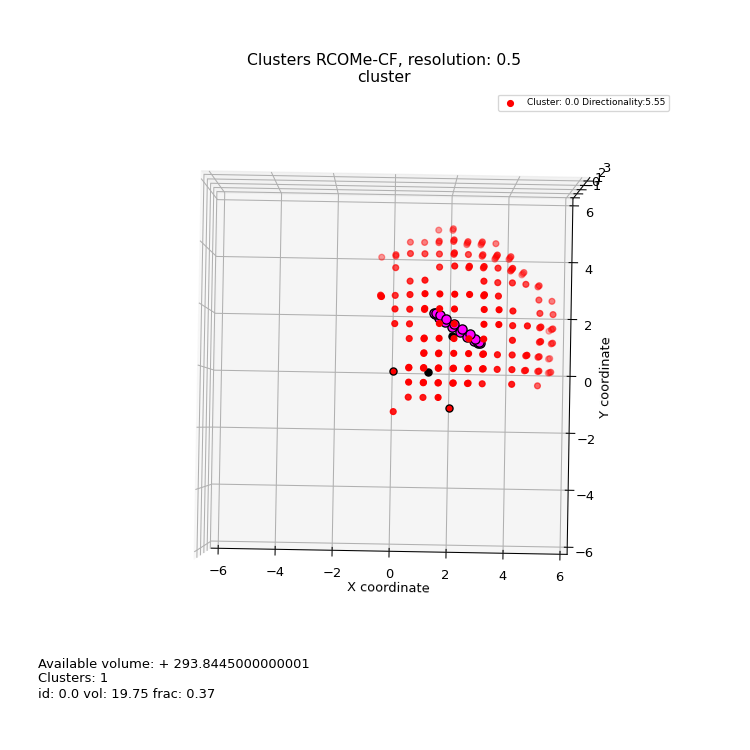

[0.]
Added another: 71
Dit is de lijst van alex: 146
Added another: 21
Dit is de lijst van alex: 48
Added another: 15
Dit is de lijst van alex: 36
Added another: 10
Dit is de lijst van alex: 26
Added another: 8
Dit is de lijst van alex: 20
Added another: 6
Dit is de lijst van alex: 15
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


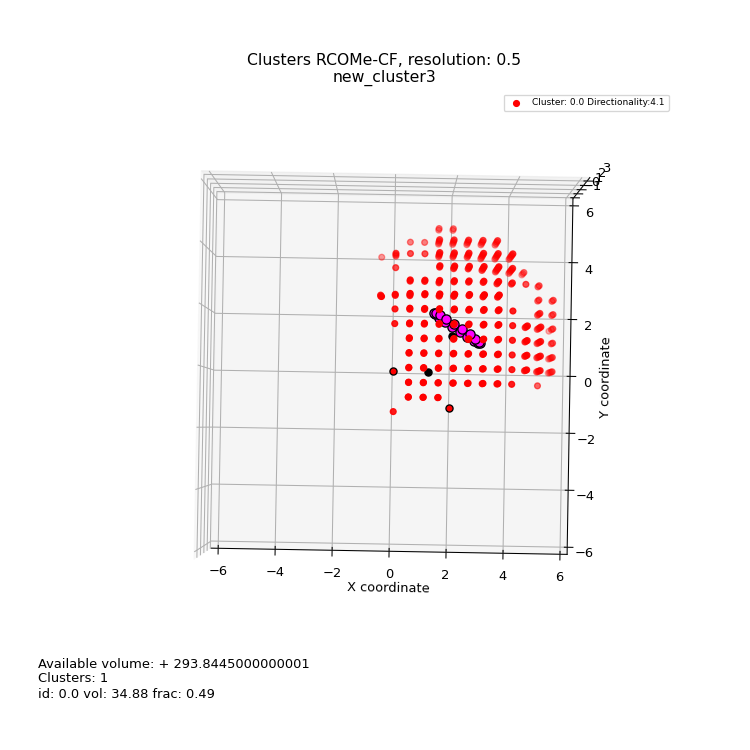

[0.]
RCOMe RCN
.\results\RCOMe\RCOMe_RCN_vdw.5\RCOMe_RCN_density.hdf N05
      xstart  ystart    zstart     N
2972    1.25    -0.2  3.192308  21.0
Threshold k-means: 5.25 max_bin: 21.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 21.0 fraction for this bin:  5.25
Added 94 new bins
Added 0 new bins
Available volume: 314.0205000000001


<IPython.core.display.Javascript object>


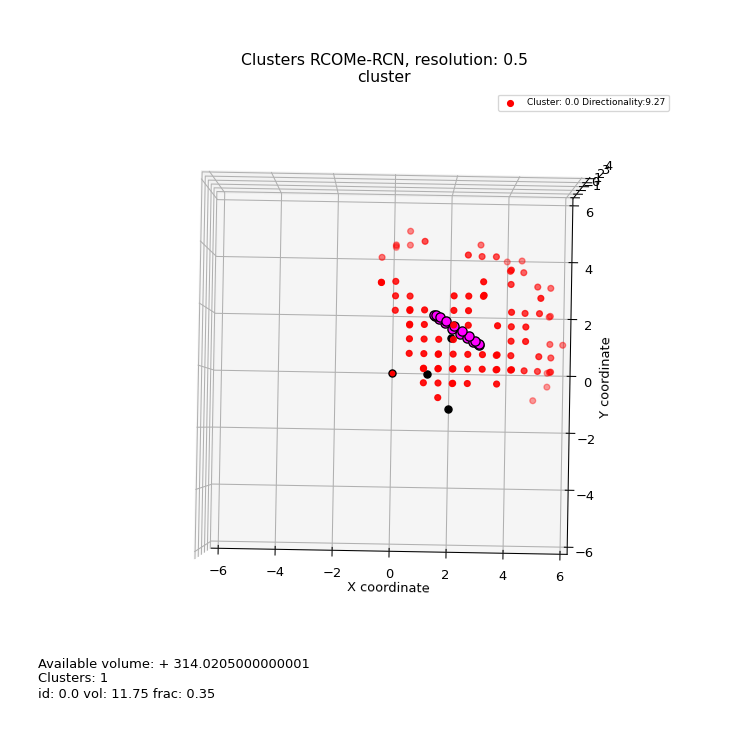

[0.]
Added another: 12
Dit is de lijst van alex: 34
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


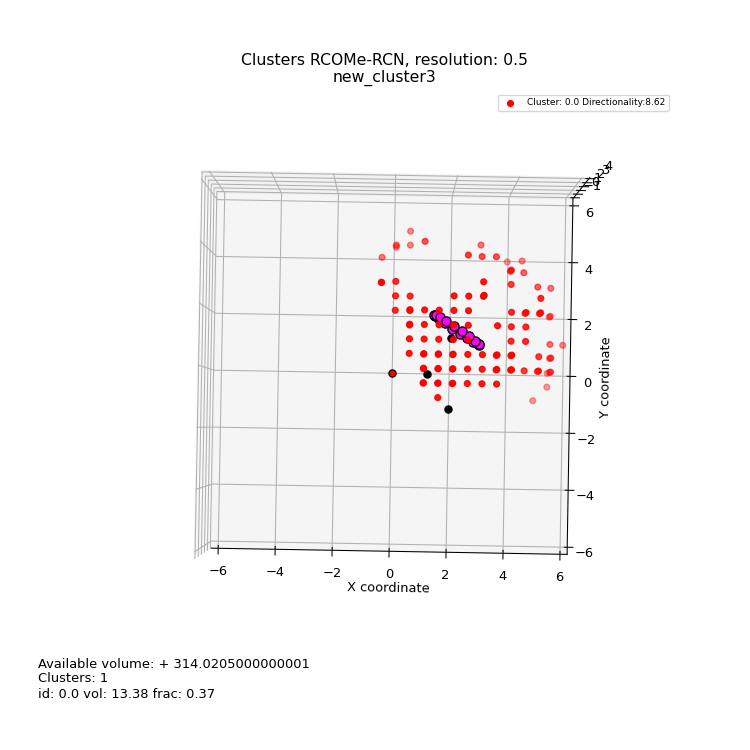

[0.]
RCOMe R2CO
.\results\RCOMe\RCOMe_R2CO_vdw.5\RCOMe_R2CO_density.hdf O05
        xstart    ystart    zstart      O
6072  4.615385 -1.152174 -0.038462  668.0
Threshold k-means: 167.0 max_bin: 668.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 668.0 fraction for this bin:  167.0
Added 95 new bins
Added 0 new bins
Available volume: 307.24000000000007


<IPython.core.display.Javascript object>


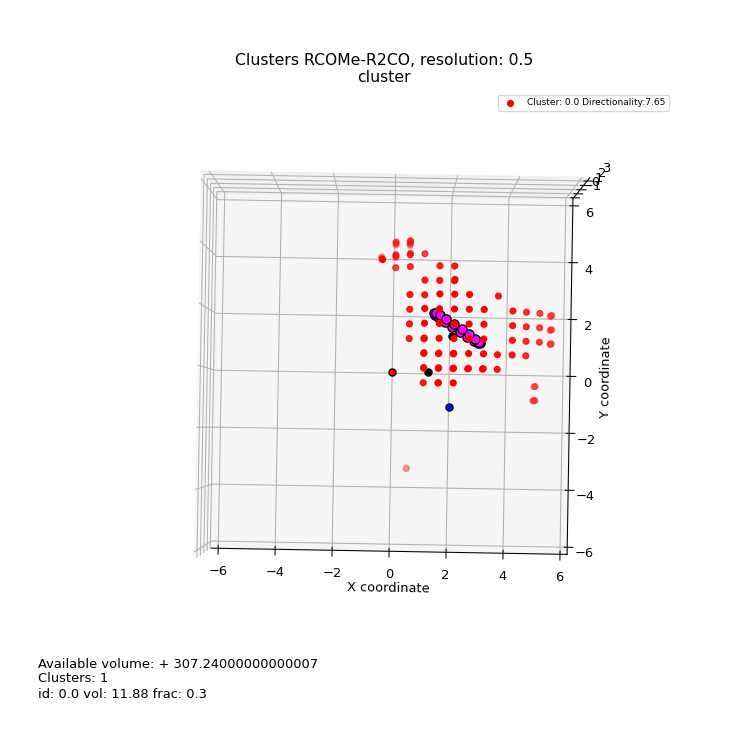

[0.]
Added another: 32
Dit is de lijst van alex: 54
Added another: 3
Dit is de lijst van alex: 9
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


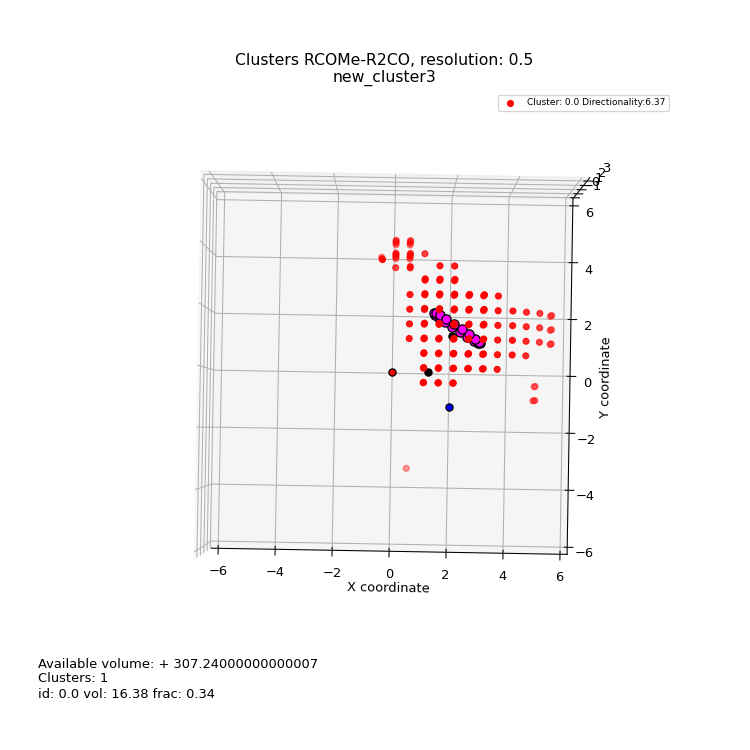

[0.]
RCOMe XH
.\results\RCOMe\RCOMe_XH_vdw.5\RCOMe_XH_density.hdf H05
      xstart    ystart    zstart       H
1729  -1.625  1.227273 -0.041667  1233.0
Threshold k-means: 308.25 max_bin: 1233.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 1233.0 fraction for this bin:  308.25
Added 14 new bins
Added 0 new bins
Available volume: 210.74750000000003


<IPython.core.display.Javascript object>

[0.]
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


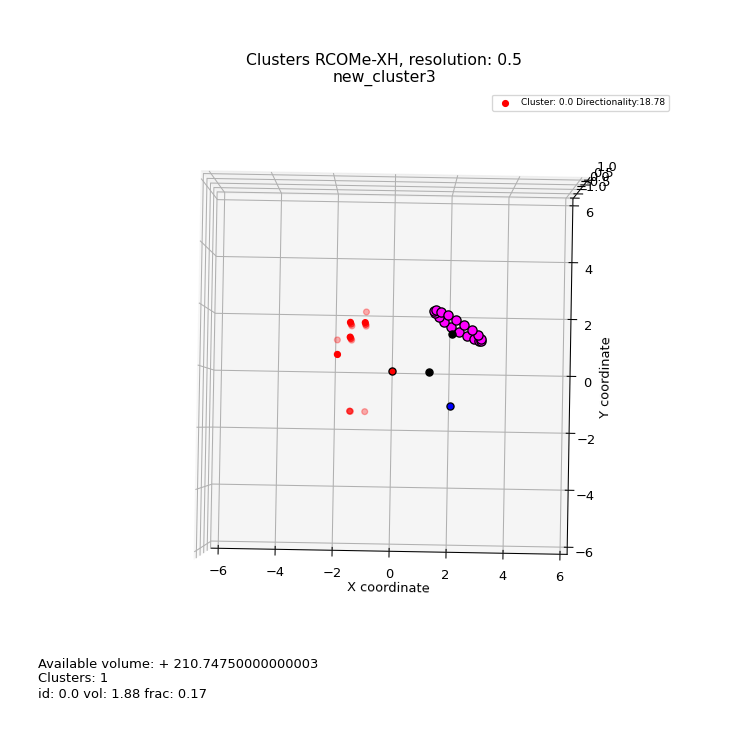

[0.]
RCOMe XH
.\results\RCOMe\RCOMe_XH_vdw.5\RCOMe_XH_density.hdf O05
        xstart    ystart    zstart      O
1299 -1.613636  2.190476 -0.045455  759.0
Threshold k-means: 189.75 max_bin: 759.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 759.0 fraction for this bin:  189.75
Added 18 new bins
Added 0 new bins
Available volume: 307.63650000000007


<IPython.core.display.Javascript object>


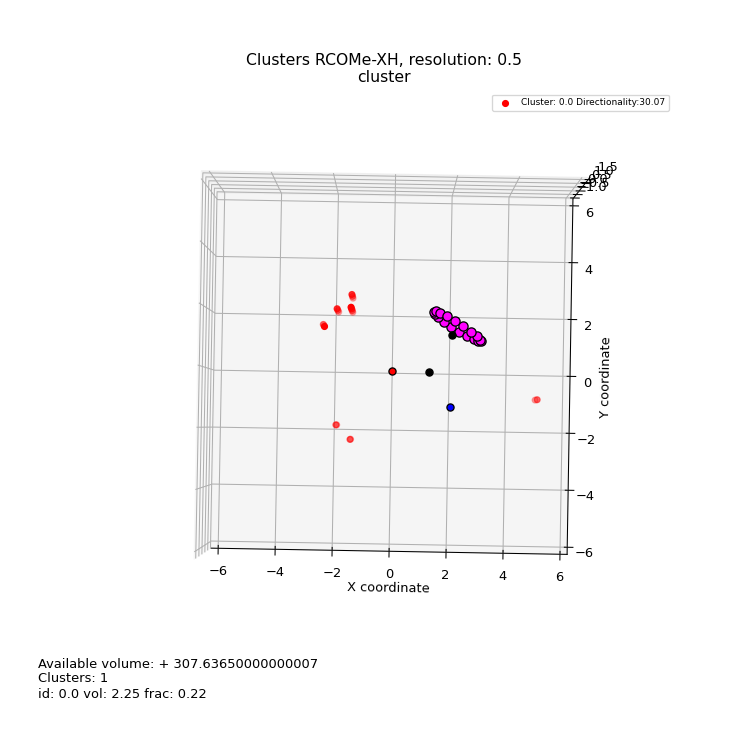

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


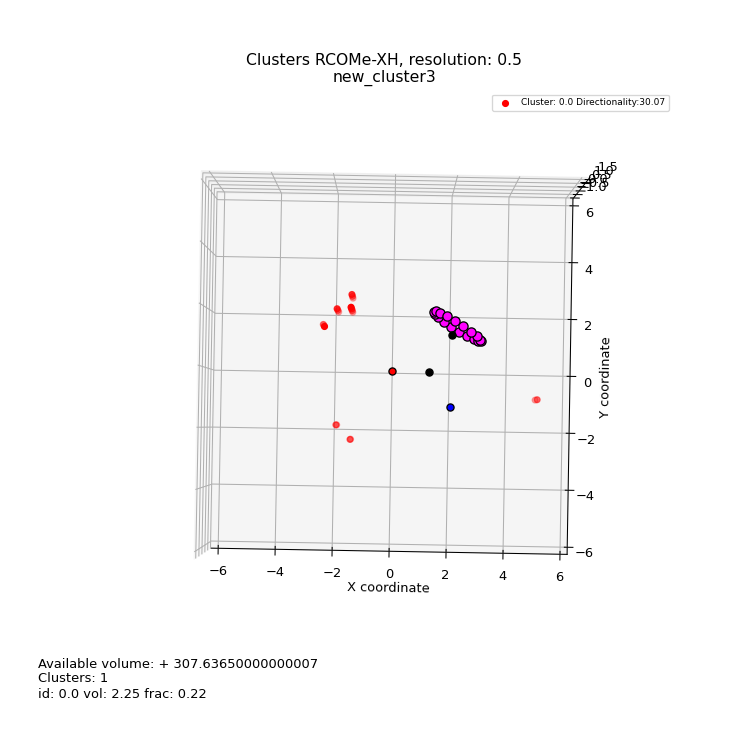

[0.]
RCOMe CCH3
.\results\RCOMe\RCOMe_CCH3_vdw.5\RCOMe_CCH3_density.hdf H05
      xstart    ystart    zstart      H
1326   -0.65  2.166667  1.727273  167.0
Threshold k-means: 41.75 max_bin: 167.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 167.0 fraction for this bin:  41.75
Added 447 new bins
Added 0 new bins
Available volume: 209.94000000000008


<IPython.core.display.Javascript object>


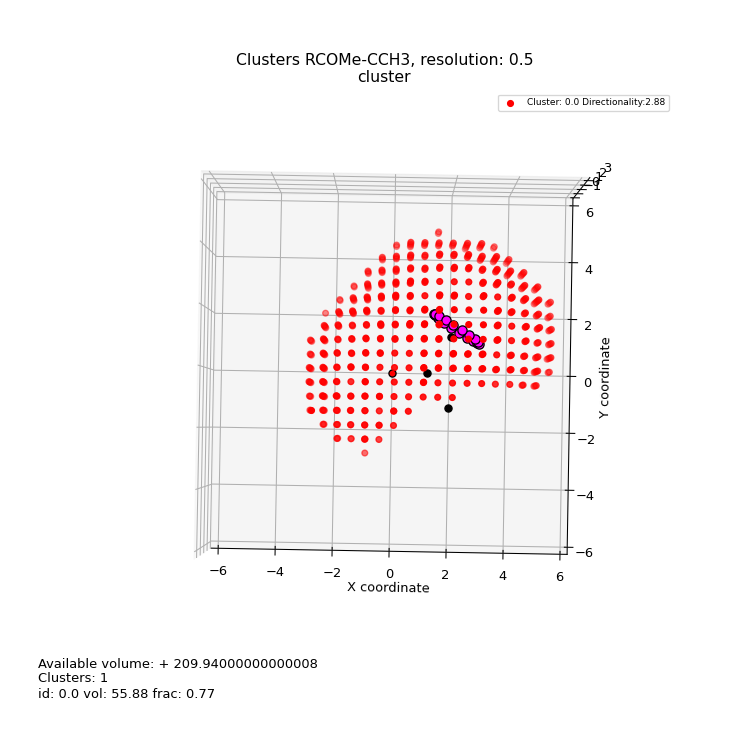

[0.]
Added another: 198
Dit is de lijst van alex: 318
Added another: 113
Dit is de lijst van alex: 185
Added another: 89
Dit is de lijst van alex: 143
Added another: 77
Dit is de lijst van alex: 111
Added another: 61
Dit is de lijst van alex: 92
Added another: 53
Dit is de lijst van alex: 82
Added another: 49
Dit is de lijst van alex: 76
Added another: 46
Dit is de lijst van alex: 74
Added another: 36
Dit is de lijst van alex: 61
Added another: 26
Dit is de lijst van alex: 45
Added another: 18
Dit is de lijst van alex: 32
Added another: 9
Dit is de lijst van alex: 21
Added another: 3
Dit is de lijst van alex: 8
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RCOMe C2CH2
.\results\RCOMe\RCOMe_C2CH2_vdw.5\RCOMe_C2CH2_density.hdf H05
      xstart    ystart    zstart      H
1061  -1.125  2.176471  1.272727  117.0
Threshold k-means: 29.25 max_bin: 117.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 117.0 fraction for this bin:  29.25
Added 357 new bins
Added 0 new bins
Available volume: 210.34500000000006


<IPython.core.display.Javascript object>

[0.]
Added another: 163
Dit is de lijst van alex: 270
Added another: 104
Dit is de lijst van alex: 172
Added another: 79
Dit is de lijst van alex: 119
Added another: 67
Dit is de lijst van alex: 95
Added another: 53
Dit is de lijst van alex: 74
Added another: 48
Dit is de lijst van alex: 67
Added another: 42
Dit is de lijst van alex: 58
Added another: 36
Dit is de lijst van alex: 53
Added another: 30
Dit is de lijst van alex: 47
Added another: 24
Dit is de lijst van alex: 40
Added another: 16
Dit is de lijst van alex: 31
Added another: 8
Dit is de lijst van alex: 14
Added another: 6
Dit is de lijst van alex: 14
Added another: 3
Dit is de lijst van alex: 8
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RCOMe RC6H5
.\results\RCOMe\RCOMe_RC6H5_vdw.5\RCOMe_RC6H5_density.hdf centroid05
      xstart    ystart    zstart  centroid
2830  -2.125  4.115385  0.428571      76.0
Threshold k-means: 19.0 max_bin: 76.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 76.0 fraction for this bin:  19.0
Added 634 new bins
Added 0 new bins
Available volume: 1409.9105000000004


<IPython.core.display.Javascript object>

[0.]
Added another: 296
Dit is de lijst van alex: 500
Added another: 159
Dit is de lijst van alex: 297
Added another: 113
Dit is de lijst van alex: 220
Added another: 83
Dit is de lijst van alex: 162
Added another: 69
Dit is de lijst van alex: 126
Added another: 66
Dit is de lijst van alex: 119
Added another: 57
Dit is de lijst van alex: 98
Added another: 43
Dit is de lijst van alex: 78
Added another: 35
Dit is de lijst van alex: 64
Added another: 33
Dit is de lijst van alex: 59
Added another: 30
Dit is de lijst van alex: 52
Added another: 27
Dit is de lijst van alex: 46
Added another: 27
Dit is de lijst van alex: 46
Added another: 25
Dit is de lijst van alex: 41
Added another: 24
Dit is de lijst van alex: 37
Added another: 17
Dit is de lijst van alex: 28
Added another: 15
Dit is de lijst van alex: 28
Added another: 10
Dit is de lijst van alex: 21
Added another: 9
Dit is de lijst van alex: 19
Added another: 7
Dit is de lijst van alex: 14
Added another: 5
Dit is de lijst van alex: 9
Add

<IPython.core.display.Javascript object>

[0.]
RCOMe ArCH
.\results\RCOMe\RCOMe_ArCH_vdw.5\RCOMe_ArCH_density.hdf H05
        xstart    ystart    zstart      H
2234 -0.659091  1.714286  1.714286  263.0
Threshold k-means: 65.75 max_bin: 263.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 263.0 fraction for this bin:  65.75
Added 328 new bins
Added 0 new bins
Available volume: 209.59300000000007


<IPython.core.display.Javascript object>

[0.]
Added another: 165
Dit is de lijst van alex: 257
Added another: 92
Dit is de lijst van alex: 153
Added another: 71
Dit is de lijst van alex: 110
Added another: 56
Dit is de lijst van alex: 89
Added another: 51
Dit is de lijst van alex: 84
Added another: 43
Dit is de lijst van alex: 69
Added another: 34
Dit is de lijst van alex: 53
Added another: 26
Dit is de lijst van alex: 45
Added another: 18
Dit is de lijst van alex: 36
Added another: 9
Dit is de lijst van alex: 21
Added another: 3
Dit is de lijst van alex: 9
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


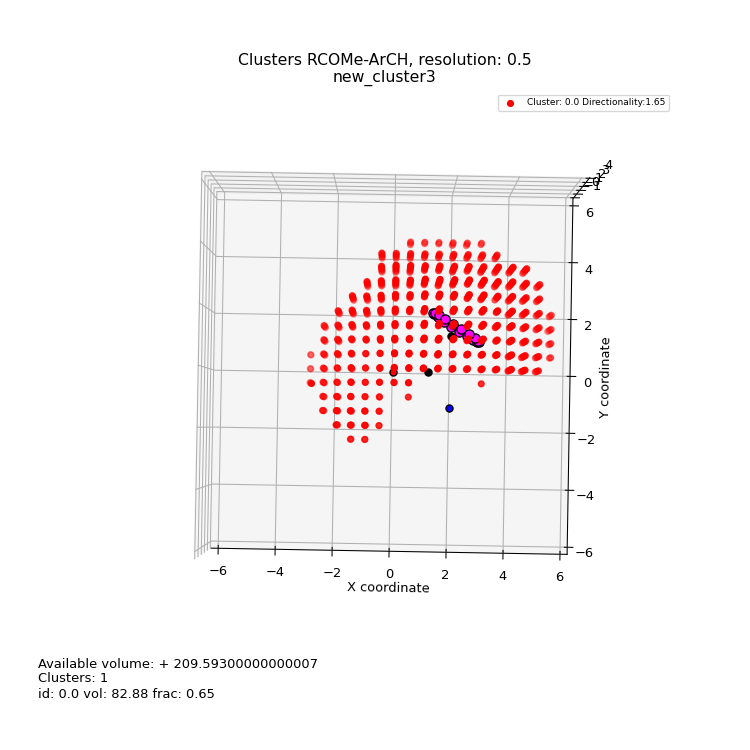

[0.]
RNO2 CF
.\results\RNO2\RNO2_CF_vdw.5\RNO2_CF_density.hdf F05
        xstart  ystart    zstart     F
2251  1.305556   -0.24  2.708333  34.0
Threshold k-means: 8.5 max_bin: 34.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 34.0 fraction for this bin:  8.5
Added 130 new bins
Added 0 new bins
Available volume: 242.70250000000004


<IPython.core.display.Javascript object>


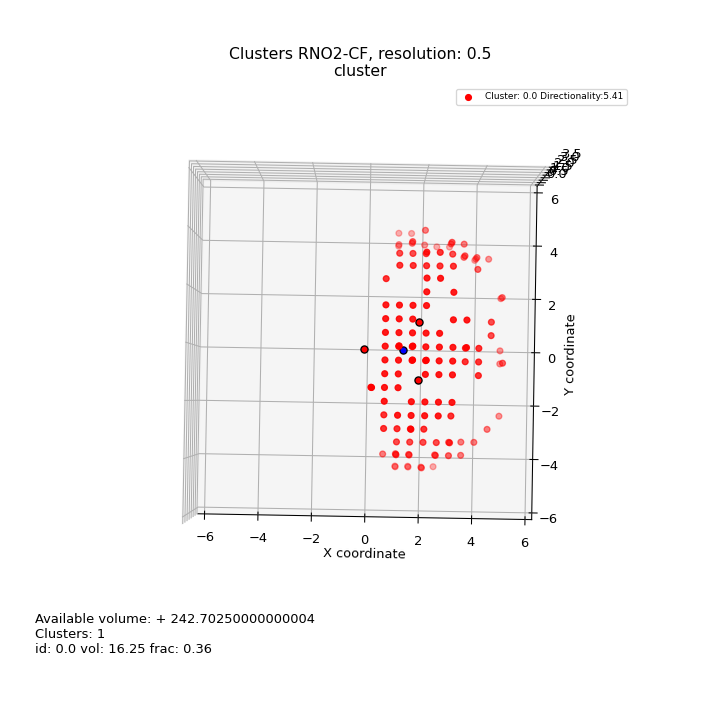

[0.]
Added another: 36
Dit is de lijst van alex: 89
Added another: 8
Dit is de lijst van alex: 23
Added another: 5
Dit is de lijst van alex: 14
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


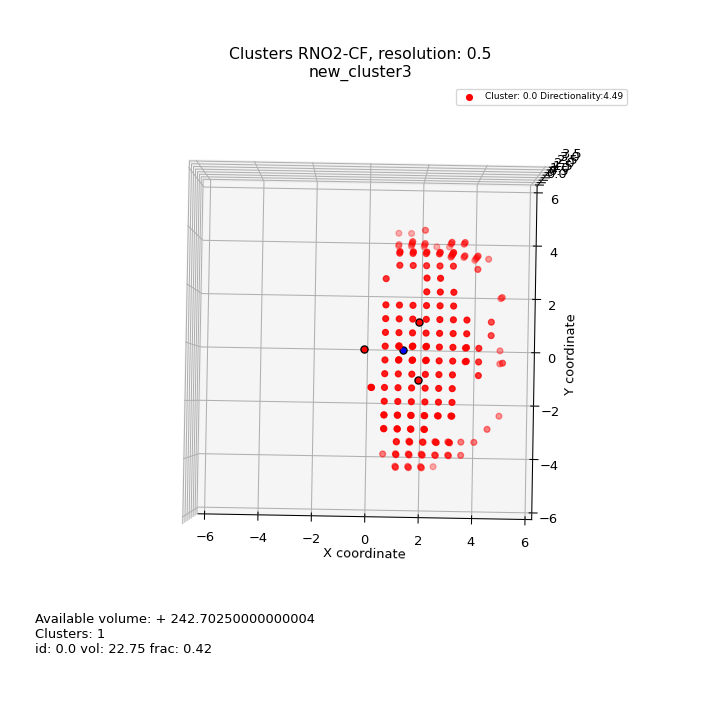

[0.]
RNO2 RCN
.\results\RNO2\RNO2_RCN_vdw.5\RNO2_RCN_density.hdf N05
        xstart   ystart    zstart     N
1647  1.323529 -0.23913  3.136364  40.0
Threshold k-means: 10.0 max_bin: 40.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 40.0 fraction for this bin:  10.0
Added 29 new bins
Added 0 new bins
Available volume: 260.5155000000001


c:\users\natas\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


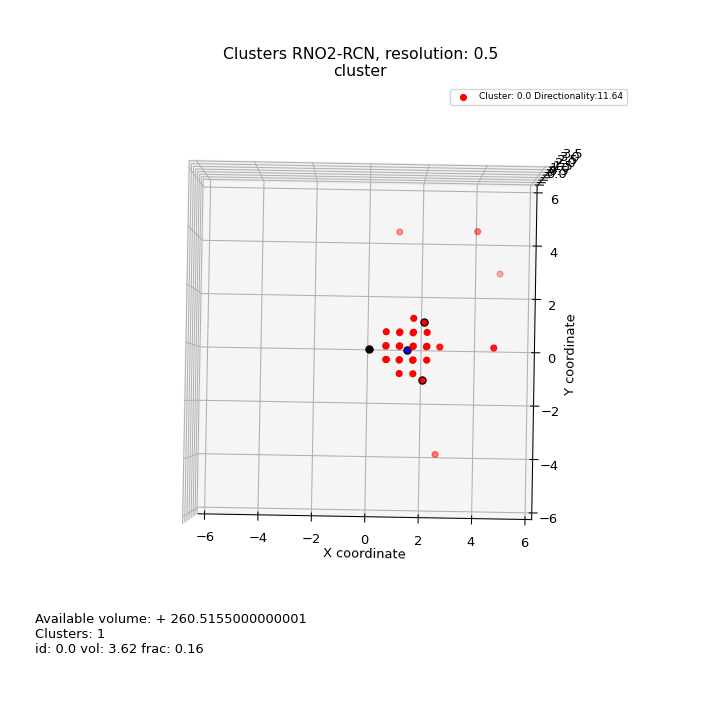

[0.]
Added another: 4
Dit is de lijst van alex: 12
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


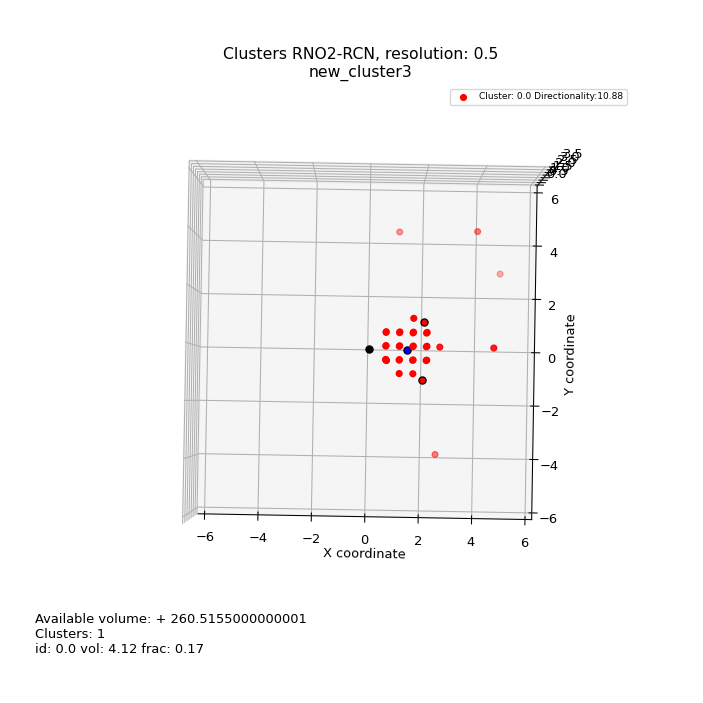

[0.]
RNO2 R2CO
.\results\RNO2\RNO2_R2CO_vdw.5\RNO2_R2CO_density.hdf O05
      xstart   ystart    zstart      O
2347     1.3 -0.23913  2.708333  478.0
Threshold k-means: 119.5 max_bin: 478.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 478.0 fraction for this bin:  119.5
Added 18 new bins
Added 0 new bins
Available volume: 253.78400000000005


<IPython.core.display.Javascript object>


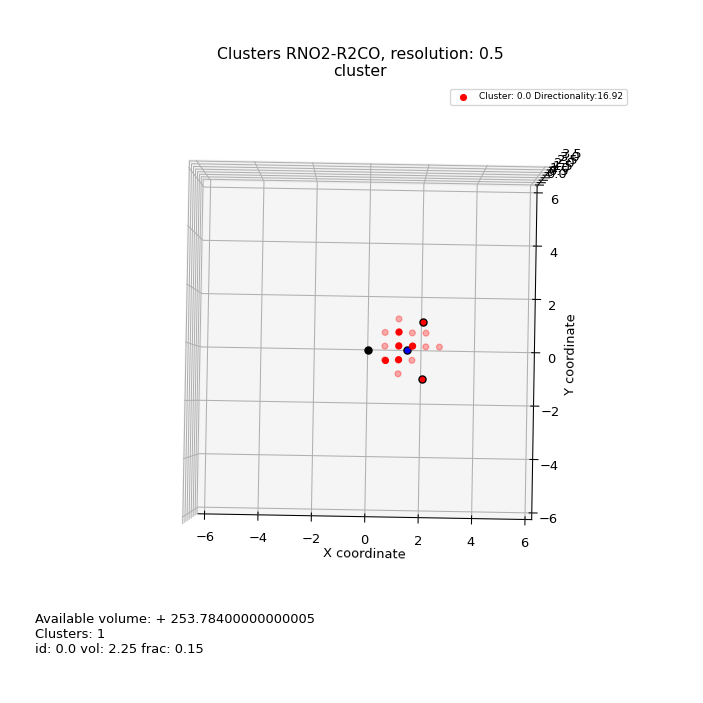

[0.]
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RNO2 XH
.\results\RNO2\RNO2_XH_vdw.5\RNO2_XH_density.hdf H05
        xstart    ystart    zstart      H
3433  3.657895  0.717391 -0.045455  997.0
Threshold k-means: 249.25 max_bin: 997.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 997.0 fraction for this bin:  249.25
Added 63 new bins
Added 0 new bins
Available volume: 171.87450000000004


<IPython.core.display.Javascript object>

[0.]
Added another: 8
Dit is de lijst van alex: 22
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RNO2 XH
.\results\RNO2\RNO2_XH_vdw.5\RNO2_XH_density.hdf O05
        xstart    ystart  zstart      O
3271  4.605263  0.714286   -0.05  686.0
Threshold k-means: 171.5 max_bin: 686.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 686.0 fraction for this bin:  171.5
Added 58 new bins
Added 0 new bins
Available volume: 255.31350000000003


<IPython.core.display.Javascript object>

[0.]
Added another: 4
Dit is de lijst van alex: 12
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RNO2 CCH3
.\results\RNO2\RNO2_CCH3_vdw.5\RNO2_CCH3_density.hdf H05
      xstart    ystart  zstart      H
2375     4.1 -0.236842    1.25  164.0
Threshold k-means: 41.0 max_bin: 164.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 164.0 fraction for this bin:  41.0
Added 354 new bins
Added 0 new bins
Available volume: 170.39750000000004


<IPython.core.display.Javascript object>

[0.]
Added another: 106
Dit is de lijst van alex: 191
Added another: 63
Dit is de lijst van alex: 124
Added another: 57
Dit is de lijst van alex: 109
Added another: 61
Dit is de lijst van alex: 103
Added another: 61
Dit is de lijst van alex: 102
Added another: 57
Dit is de lijst van alex: 84
Added another: 47
Dit is de lijst van alex: 63
Added another: 36
Dit is de lijst van alex: 47
Added another: 23
Dit is de lijst van alex: 31
Added another: 9
Dit is de lijst van alex: 12
Added another: 2
Dit is de lijst van alex: 4
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


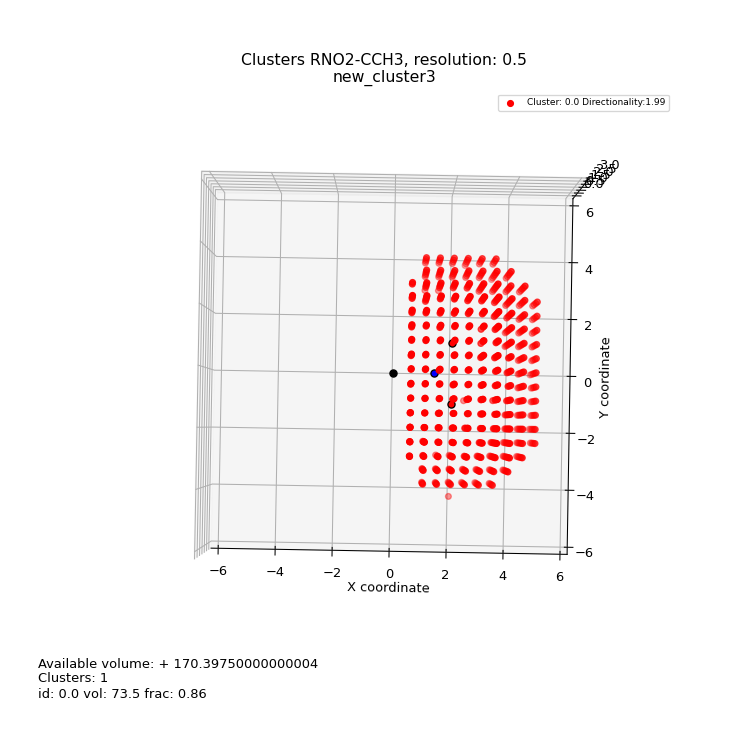

[0.]
RNO2 C2CH2
.\results\RNO2\RNO2_C2CH2_vdw.5\RNO2_C2CH2_density.hdf H05
      xstart    ystart  zstart      H
2625     4.1 -0.238095    1.25  145.0
Threshold k-means: 36.25 max_bin: 145.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 145.0 fraction for this bin:  36.25
Added 308 new bins
Added 0 new bins
Available volume: 170.53700000000003


<IPython.core.display.Javascript object>


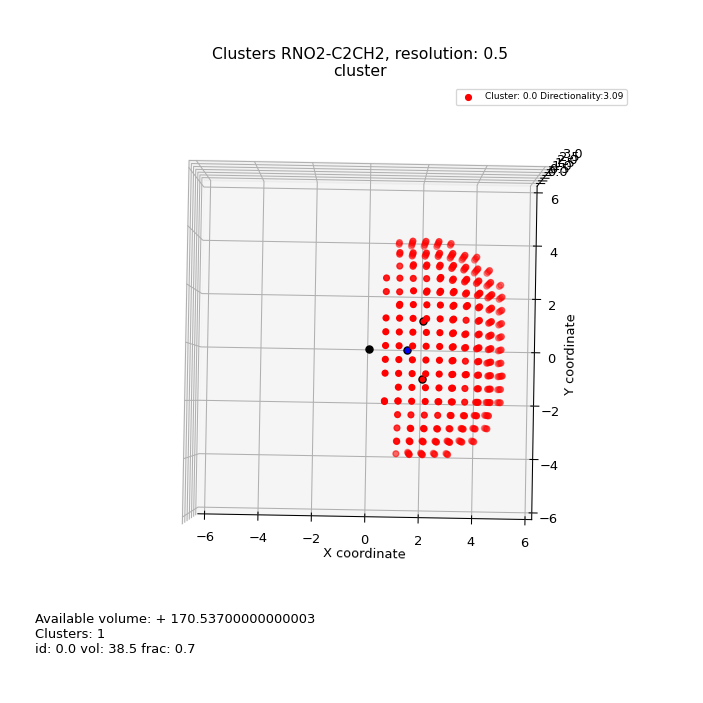

[0.]
Added another: 107
Dit is de lijst van alex: 191
Added another: 68
Dit is de lijst van alex: 118
Added another: 66
Dit is de lijst van alex: 101
Added another: 70
Dit is de lijst van alex: 95
Added another: 54
Dit is de lijst van alex: 70
Added another: 48
Dit is de lijst van alex: 62
Added another: 37
Dit is de lijst van alex: 49
Added another: 18
Dit is de lijst van alex: 30
Added another: 8
Dit is de lijst van alex: 15
Added another: 5
Dit is de lijst van alex: 12
Added another: 5
Dit is de lijst van alex: 12
Added another: 5
Dit is de lijst van alex: 12
Added another: 5
Dit is de lijst van alex: 12
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


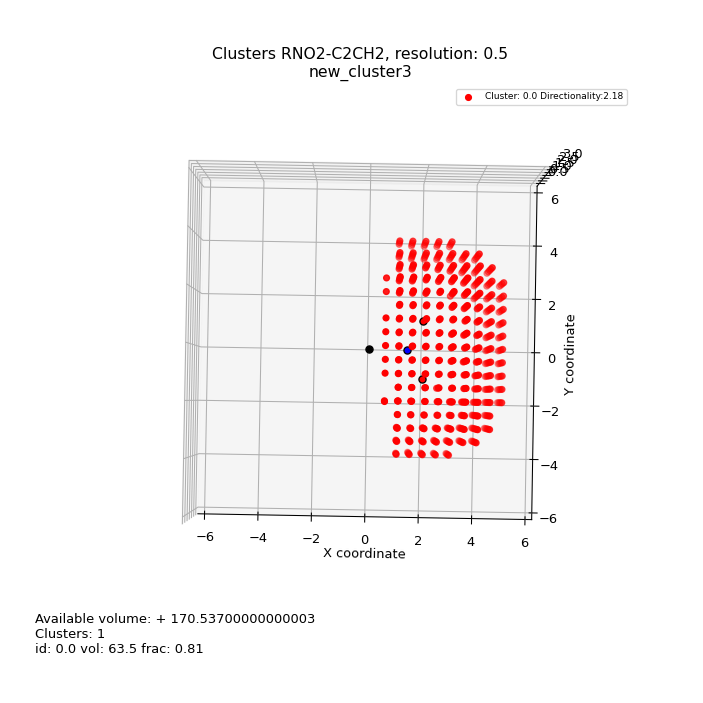

[0.]
RNO2 RC6H5
.\results\RNO2\RNO2_RC6H5_vdw.5\RNO2_RC6H5_density.hdf centroid05
        xstart    ystart    zstart  centroid
2634 -0.152174 -0.240741  3.192308     112.0
Threshold k-means: 28.0 max_bin: 112.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 112.0 fraction for this bin:  28.0
Added 291 new bins
Added 0 new bins
Available volume: 2367.0245000000004


<IPython.core.display.Javascript object>


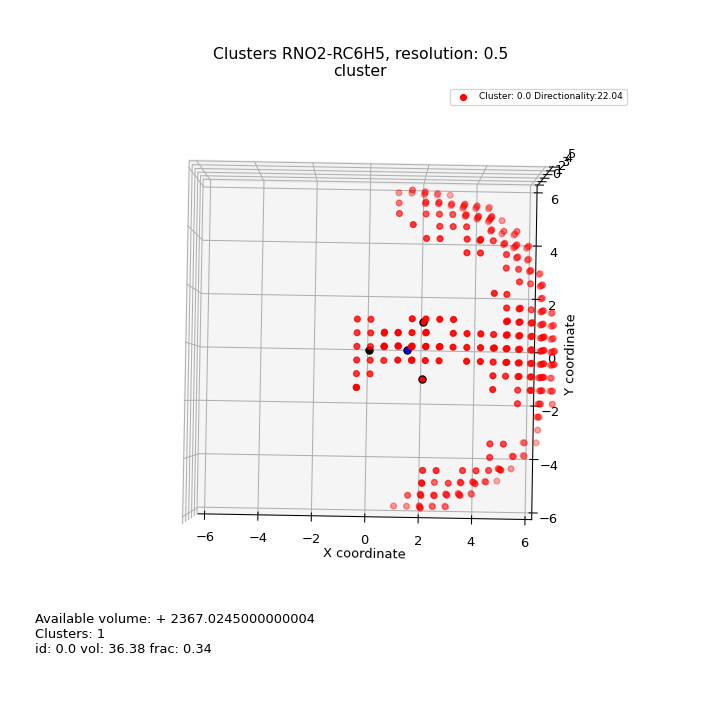

[0.]
Added another: 77
Dit is de lijst van alex: 184
Added another: 14
Dit is de lijst van alex: 38
Added another: 11
Dit is de lijst van alex: 29
Added another: 7
Dit is de lijst van alex: 19
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


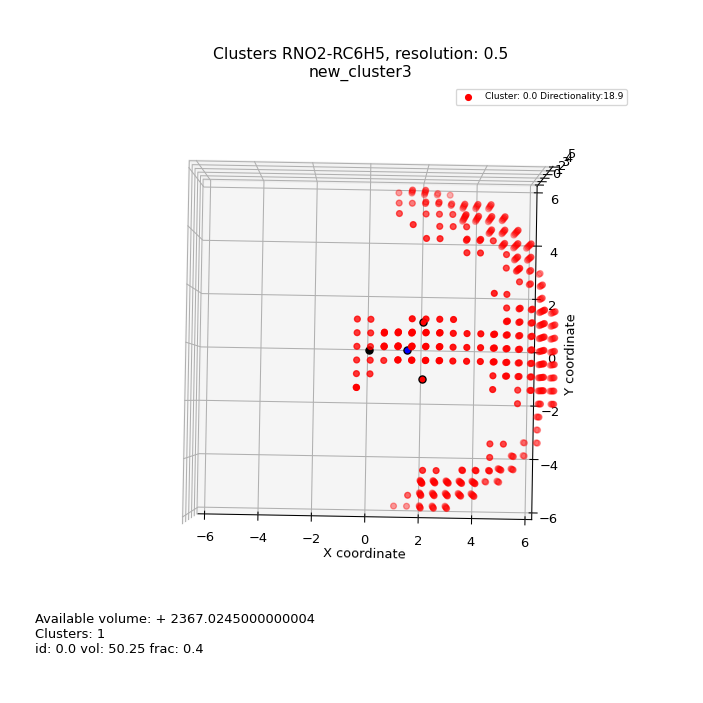

[0.]
RNO2 ArCH
.\results\RNO2\RNO2_ArCH_vdw.5\RNO2_ArCH_density.hdf H05
        xstart    ystart    zstart      H
3673  3.617647 -0.714286  1.230769  312.0
Threshold k-means: 78.0 max_bin: 312.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 312.0 fraction for this bin:  78.0
Added 292 new bins
Added 0 new bins
Available volume: 170.389


<IPython.core.display.Javascript object>


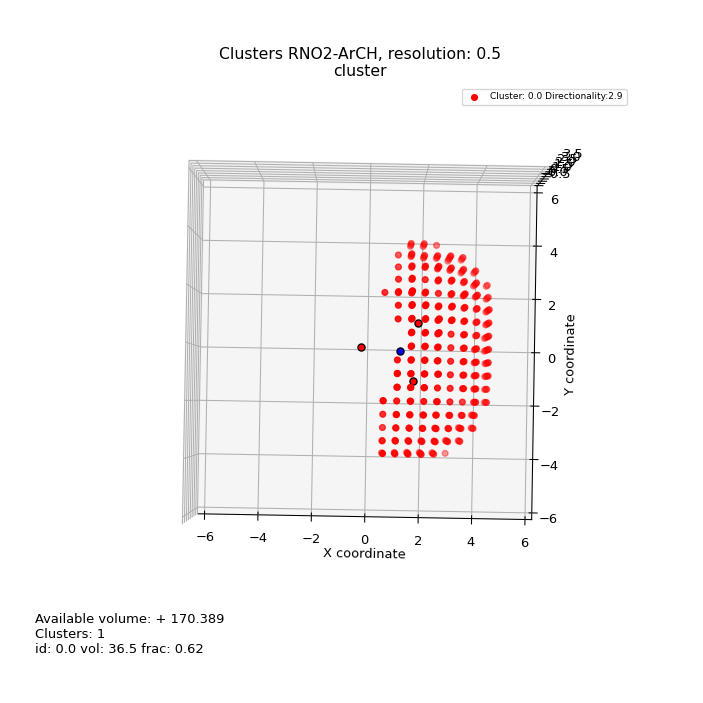

[0.]
Added another: 102
Dit is de lijst van alex: 178
Added another: 70
Dit is de lijst van alex: 113
Added another: 58
Dit is de lijst van alex: 100
Added another: 50
Dit is de lijst van alex: 89
Added another: 45
Dit is de lijst van alex: 70
Added another: 45
Dit is de lijst van alex: 63
Added another: 34
Dit is de lijst van alex: 49
Added another: 20
Dit is de lijst van alex: 32
Added another: 5
Dit is de lijst van alex: 9
Added another: 3
Dit is de lijst van alex: 7
Added another: 3
Dit is de lijst van alex: 7
Added another: 3
Dit is de lijst van alex: 7
Added another: 3
Dit is de lijst van alex: 7
Added another: 3
Dit is de lijst van alex: 7
Added another: 1
Dit is de lijst van alex: 2
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


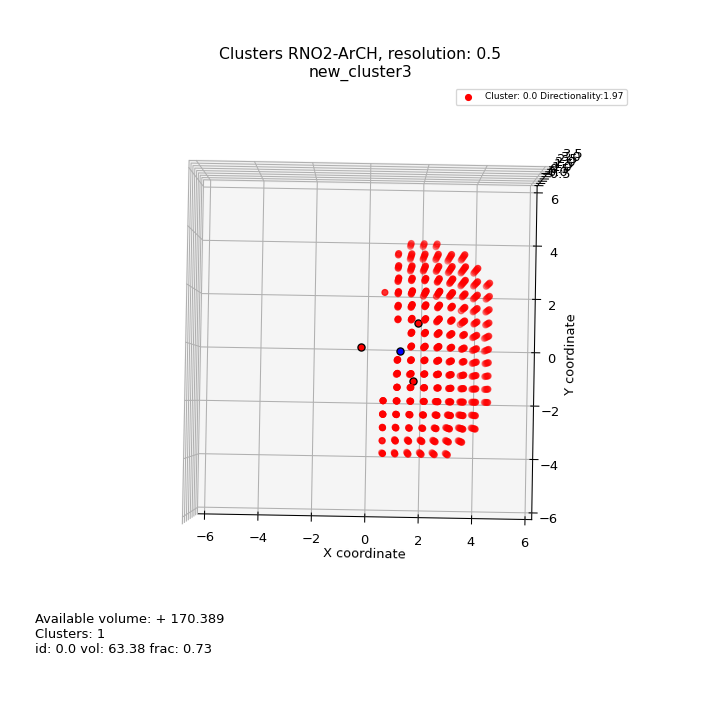

[0.]
ArCI CF
.\results\ArCI\ArCI_CF_vdw.5\ArCI_CF_density.hdf F05
        xstart  ystart    zstart     F
3320 -1.696429    0.25  3.166667  44.0
Threshold k-means: 11.0 max_bin: 44.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 44.0 fraction for this bin:  11.0
Added 190 new bins
Added 0 new bins
Available volume: 438.38850000000014


<IPython.core.display.Javascript object>


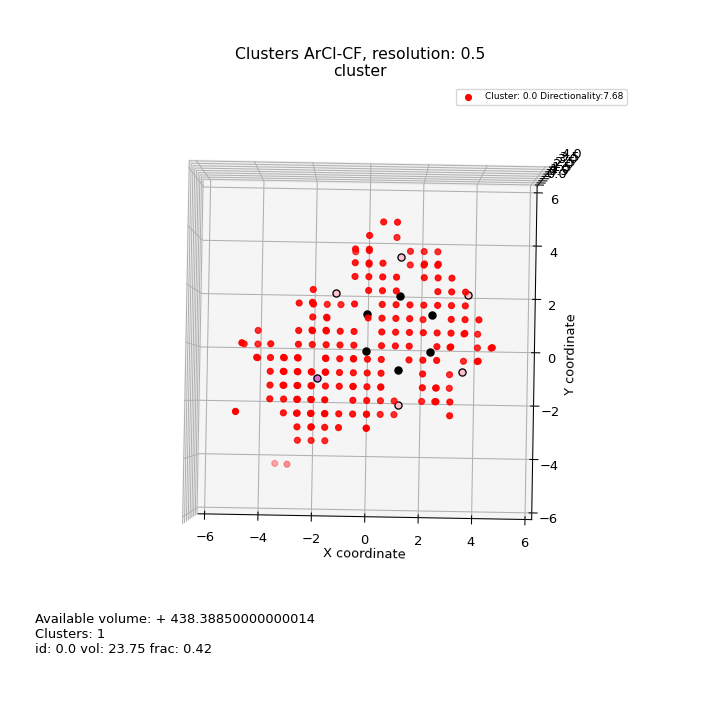

[0.]
Added another: 52
Dit is de lijst van alex: 108
Added another: 15
Dit is de lijst van alex: 37
Added another: 10
Dit is de lijst van alex: 26
Added another: 7
Dit is de lijst van alex: 19
Added another: 6
Dit is de lijst van alex: 17
Added another: 3
Dit is de lijst van alex: 9
Added another: 3
Dit is de lijst van alex: 9
Added another: 3
Dit is de lijst van alex: 9
Added another: 2
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


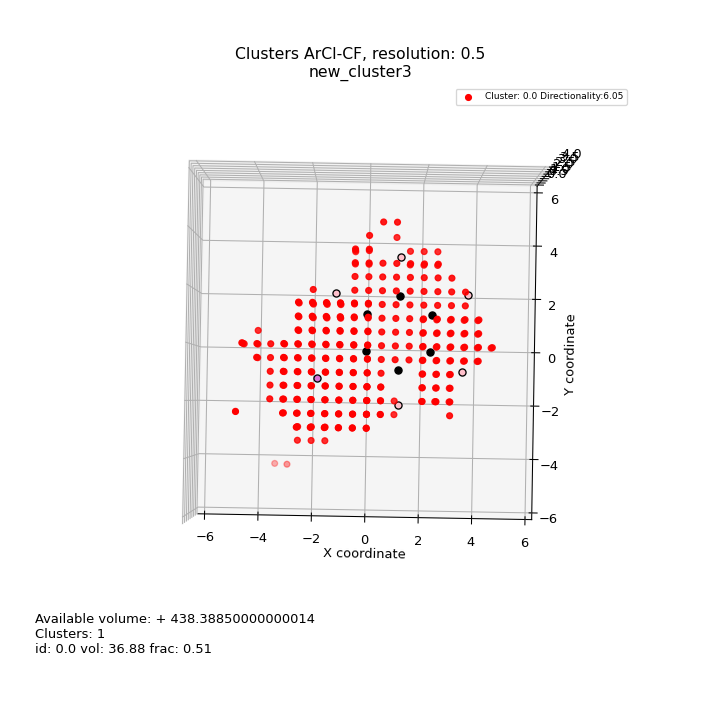

[0.]
ArCI RCN
.\results\ArCI\ArCI_RCN_vdw.5\ArCI_RCN_density.hdf N05
        xstart    ystart  zstart     N
1111 -4.576923 -2.634615   -0.05  32.0
Threshold k-means: 8.0 max_bin: 32.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 32.0 fraction for this bin:  8.0
Added 9 new bins
Added 0 new bins
Available volume: 476.51450000000006


<IPython.core.display.Javascript object>


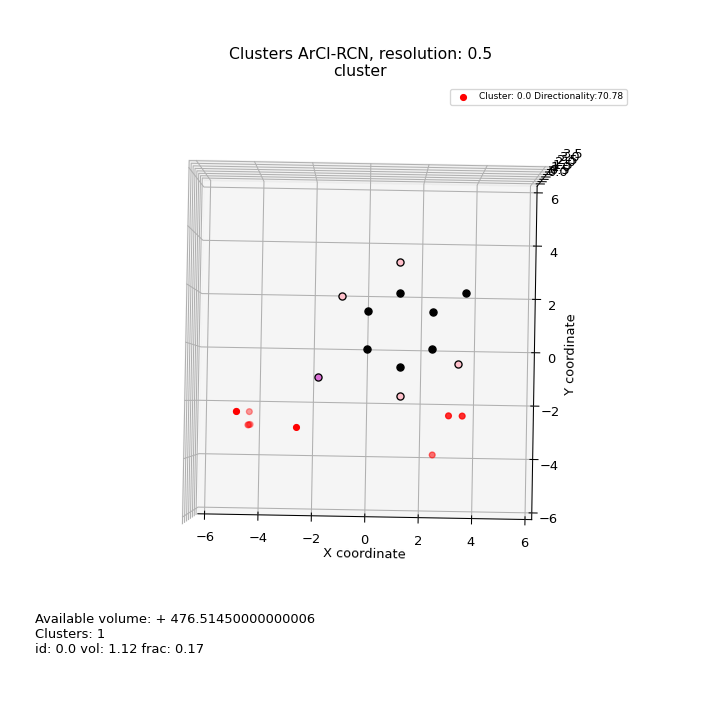

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


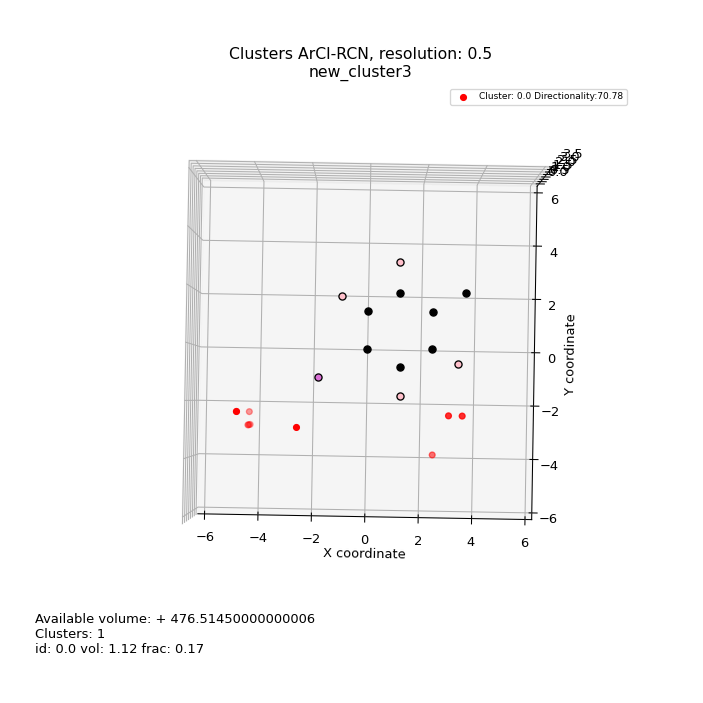

[0.]
ArCI R2CO
.\results\ArCI\ArCI_R2CO_vdw.5\ArCI_R2CO_density.hdf O05
        xstart    ystart    zstart     O
1634 -4.589286 -3.115385  0.416667  53.0
Threshold k-means: 13.25 max_bin: 53.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 53.0 fraction for this bin:  13.25
Added 15 new bins
Added 0 new bins
Available volume: 465.7315000000001


<IPython.core.display.Javascript object>


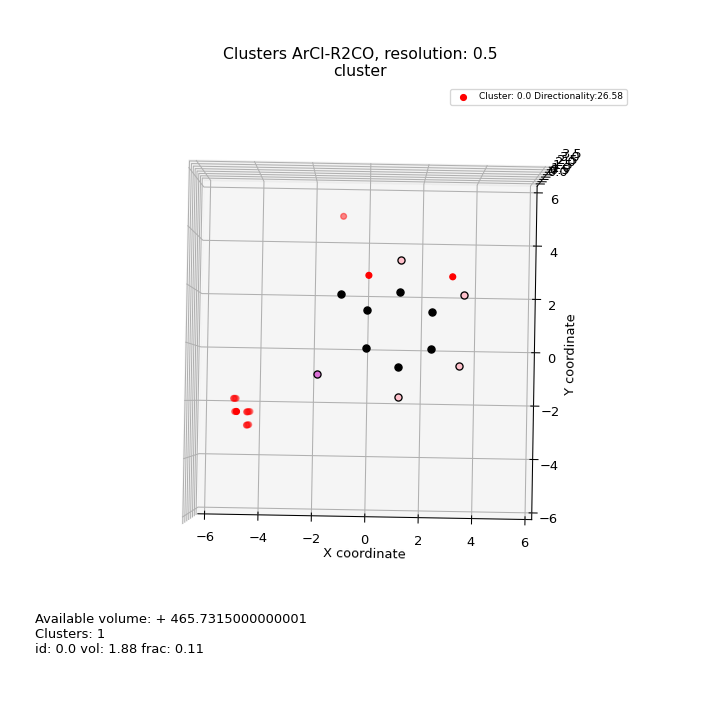

[0.]
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


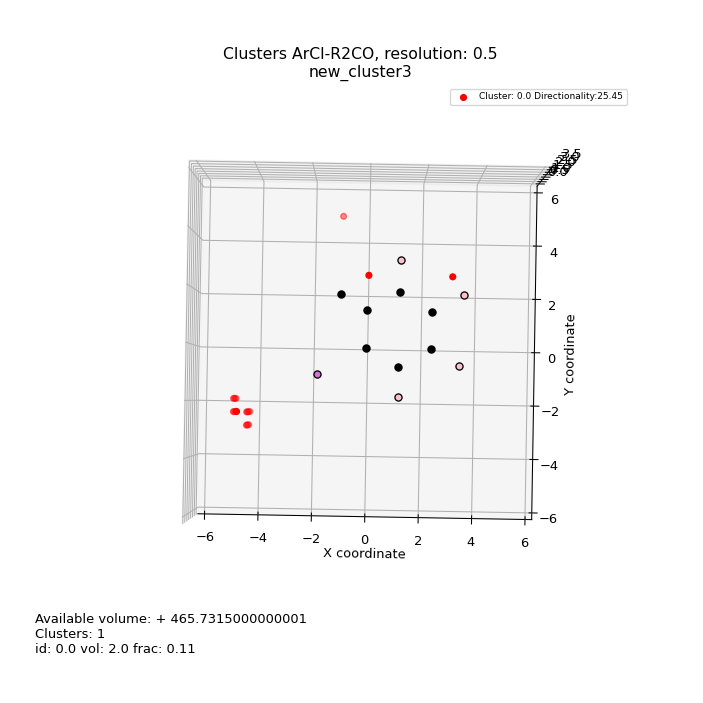

[0.]
ArCI XH
.\results\ArCI\ArCI_XH_vdw.5\ArCI_XH_density.hdf H05
       xstart  ystart    zstart     H
893 -5.055555   -2.62  0.409091  16.0
Threshold k-means: 4.0 max_bin: 16.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 16.0 fraction for this bin:  4.0
Added 191 new bins
Added 0 new bins
Available volume: 326.2155000000001


<IPython.core.display.Javascript object>


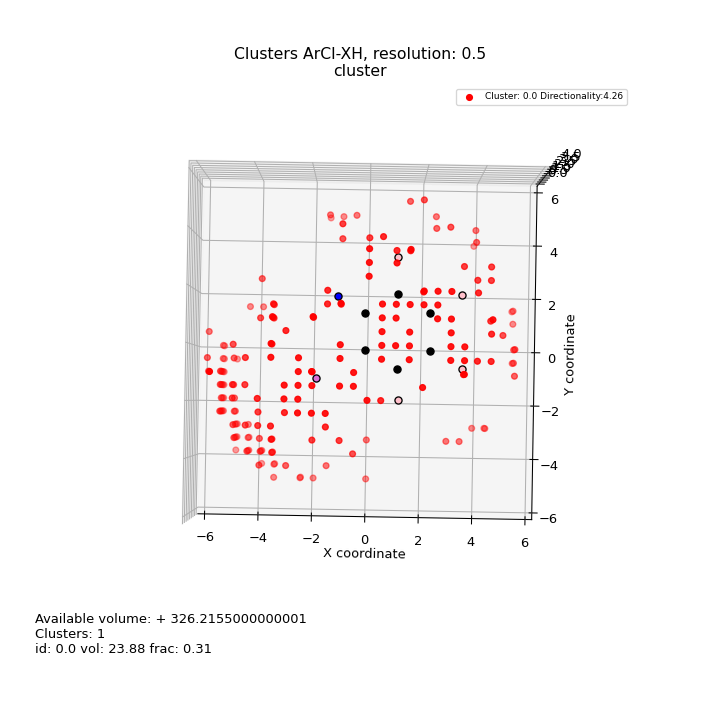

[0.]
Added another: 40
Dit is de lijst van alex: 98
Added another: 8
Dit is de lijst van alex: 21
Added another: 7
Dit is de lijst van alex: 17
Added another: 5
Dit is de lijst van alex: 12
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


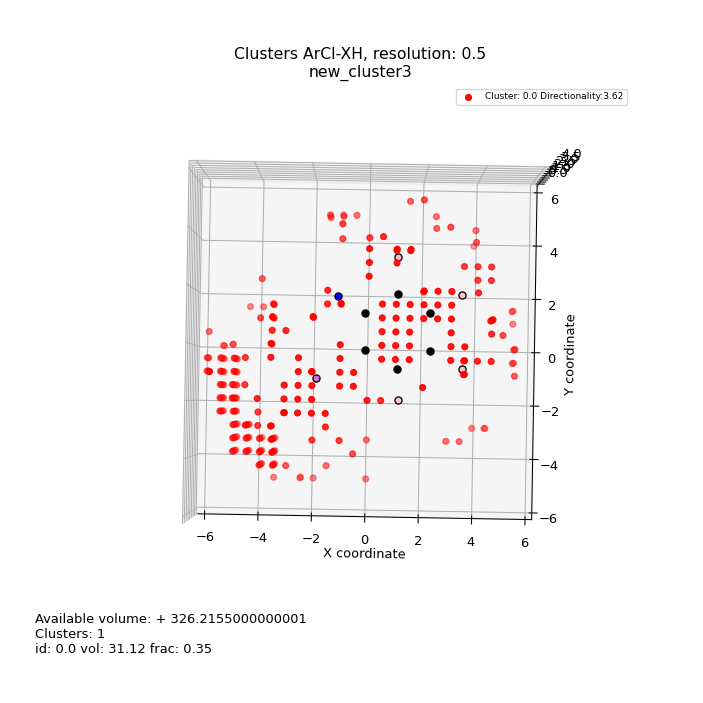

[0.]
ArCI XH
.\results\ArCI\ArCI_XH_vdw.5\ArCI_XH_density.hdf O05
     xstart  ystart  zstart     O
541   -5.04  -2.625   -0.05  19.0
Threshold k-means: 4.75 max_bin: 19.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 19.0 fraction for this bin:  4.75
Added 97 new bins
Added 0 new bins
Available volume: 462.9265000000001


<IPython.core.display.Javascript object>


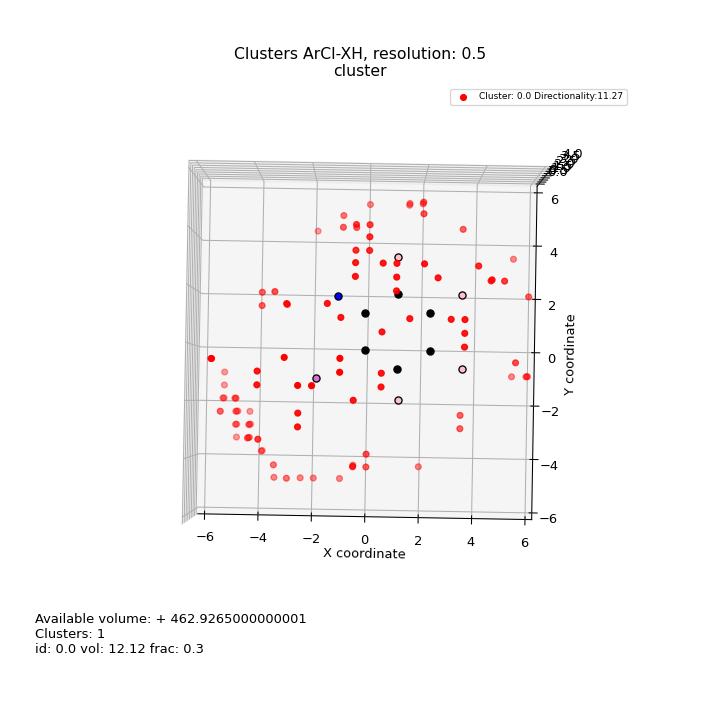

[0.]
Added another: 7
Dit is de lijst van alex: 19
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


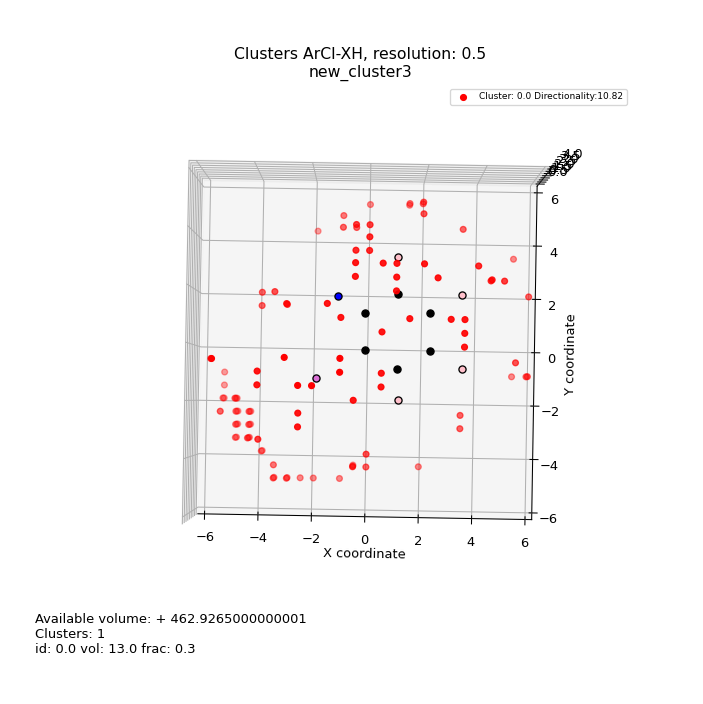

[0.]
ArCI CCH3
.\results\ArCI\ArCI_CCH3_vdw.5\ArCI_CCH3_density.hdf H05
        xstart  ystart    zstart     H
3275  0.729167    0.25  2.636364  22.0
Threshold k-means: 5.5 max_bin: 22.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 22.0 fraction for this bin:  5.5
Added 227 new bins
Added 0 new bins
Available volume: 329.1300000000001


<IPython.core.display.Javascript object>

[0.]
Added another: 71
Dit is de lijst van alex: 163
Added another: 15
Dit is de lijst van alex: 42
Added another: 9
Dit is de lijst van alex: 23
Added another: 6
Dit is de lijst van alex: 17
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 2
Dit is de lijst van alex: 5
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
ArCI C2CH2
.\results\ArCI\ArCI_C2CH2_vdw.5\ArCI_C2CH2_density.hdf H05
      xstart    ystart    zstart     H
2208 -1.1875  0.738095  2.636364  15.0
Threshold k-means: 3.75 max_bin: 15.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 15.0 fraction for this bin:  3.75
Added 239 new bins
Added 0 new bins
Available volume: 327.2720000000001


<IPython.core.display.Javascript object>

[0.]
Added another: 100
Dit is de lijst van alex: 205
Added another: 31
Dit is de lijst van alex: 69
Added another: 21
Dit is de lijst van alex: 40
Added another: 16
Dit is de lijst van alex: 36
Added another: 12
Dit is de lijst van alex: 26
Added another: 9
Dit is de lijst van alex: 24
Added another: 8
Dit is de lijst van alex: 22
Added another: 7
Dit is de lijst van alex: 18
Added another: 8
Dit is de lijst van alex: 20
Added another: 8
Dit is de lijst van alex: 19
Added another: 6
Dit is de lijst van alex: 16
Added another: 5
Dit is de lijst van alex: 12
Added another: 6
Dit is de lijst van alex: 14
Added another: 6
Dit is de lijst van alex: 14
Added another: 6
Dit is de lijst van alex: 13
Added another: 6
Dit is de lijst van alex: 13
Added another: 7
Dit is de lijst van alex: 15
Added another: 6
Dit is de lijst van alex: 14
Added another: 6
Dit is de lijst van alex: 14
Added another: 4
Dit is de lijst van alex: 10
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is

<IPython.core.display.Javascript object>

[0.]
ArCI RC6H5
.\results\ArCI\ArCI_RC6H5_vdw.5\ArCI_RC6H5_density.hdf centroid05
        xstart  ystart    zstart  centroid
3917 -3.140625   -2.65  4.607143      13.0
Threshold k-means: 3.25 max_bin: 13.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 13.0 fraction for this bin:  3.25
Added 118 new bins
Added 0 new bins
Available volume: 5041.550500000001


<IPython.core.display.Javascript object>

[0.]
Added another: 10
Dit is de lijst van alex: 30
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
ArCI ArCH
.\results\ArCI\ArCI_ArCH_vdw.5\ArCI_ArCH_density.hdf H05
        xstart  ystart    zstart     H
5428  1.211538    0.26  2.642857  38.0
Threshold k-means: 9.5 max_bin: 38.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 38.0 fraction for this bin:  9.5
Added 240 new bins
Added 0 new bins
Available volume: 329.1640000000001


<IPython.core.display.Javascript object>


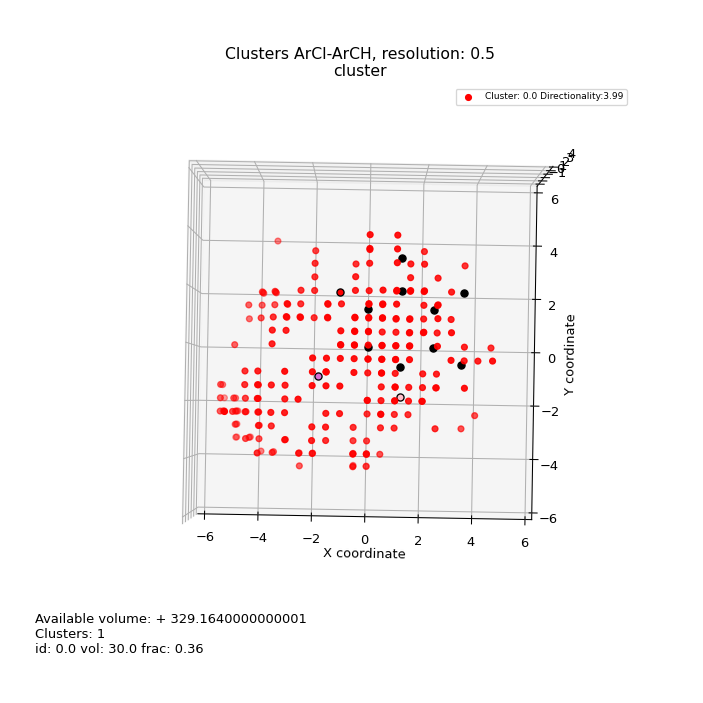

[0.]
Added another: 70
Dit is de lijst van alex: 144
Added another: 14
Dit is de lijst van alex: 35
Added another: 9
Dit is de lijst van alex: 23
Added another: 4
Dit is de lijst van alex: 10
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 5
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


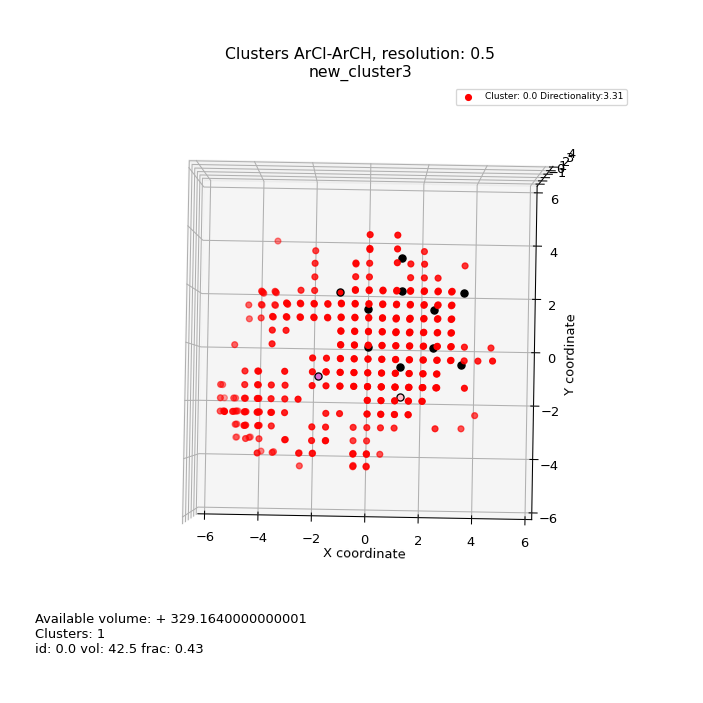

[0.]
NO3 CF
.\results\NO3\NO3_CF_vdw.5\NO3_CF_density.hdf F05
        xstart    ystart    zstart    F
2899  0.738095 -0.238095  2.708333  8.0
Threshold k-means: 2.0 max_bin: 8.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 8.0 fraction for this bin:  2.0
Added 10 new bins
Added 0 new bins
Available volume: 279.5690000000001


<IPython.core.display.Javascript object>


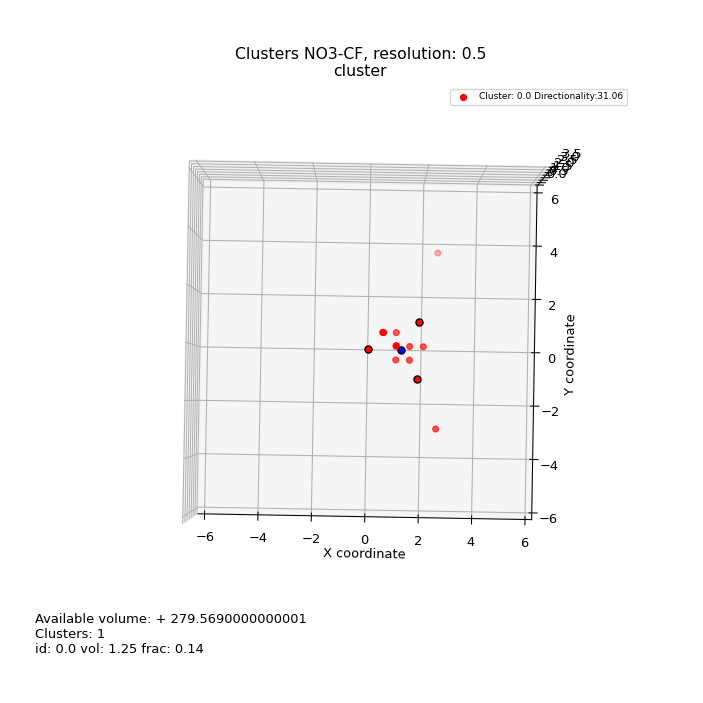

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


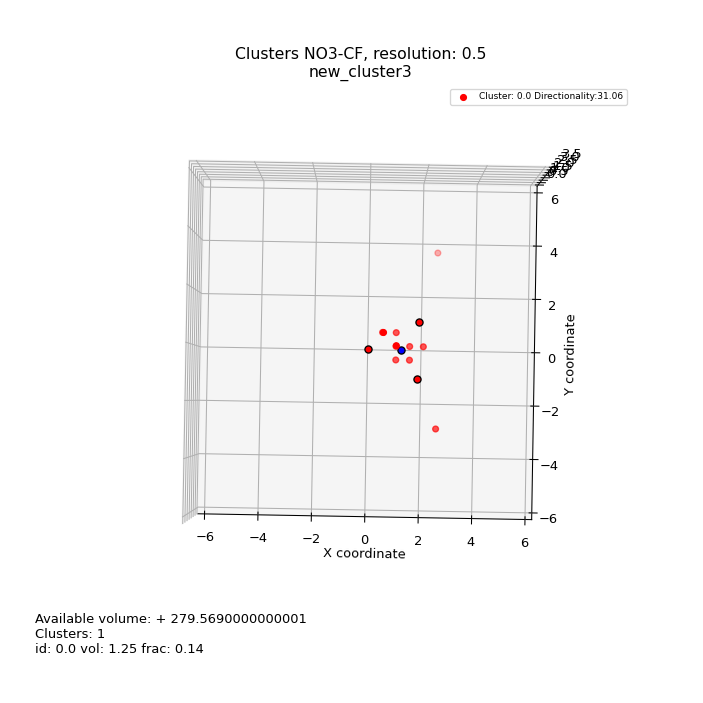

[0.]
NO3 RCN
.\results\NO3\NO3_RCN_vdw.5\NO3_RCN_density.hdf N05
        xstart    ystart    zstart    N
2620  0.282609  3.590909  0.409091  9.0
Threshold k-means: 2.25 max_bin: 9.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 9.0 fraction for this bin:  2.25
Added 11 new bins
Added 0 new bins
Available volume: 298.41800000000006


<IPython.core.display.Javascript object>


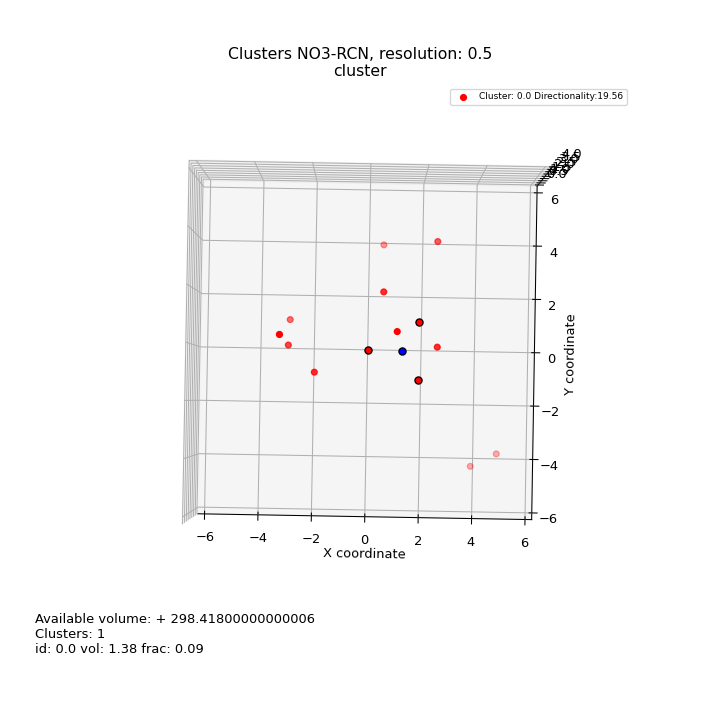

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


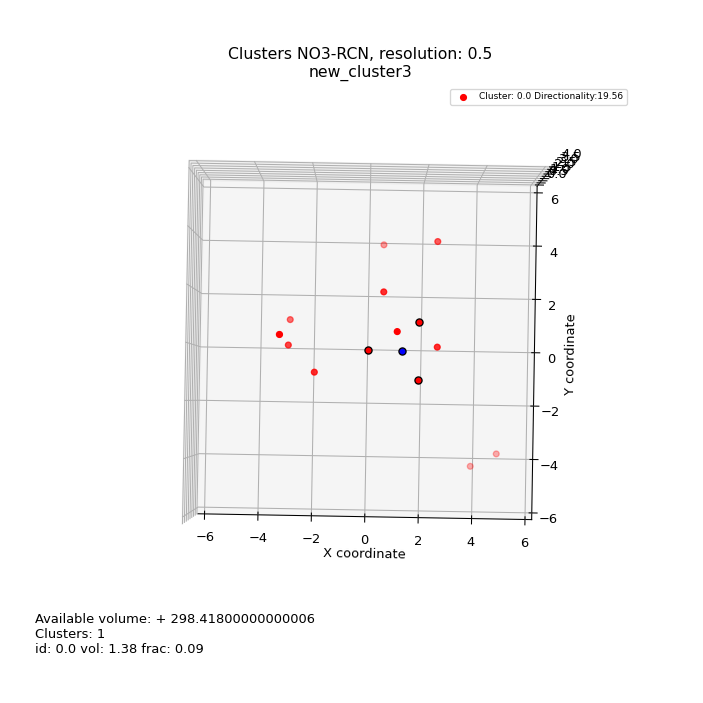

[0.]
NO3 R2CO
.\results\NO3\NO3_R2CO_vdw.5\NO3_R2CO_density.hdf O05
       xstart   ystart    zstart     O
3176  0.76087 -0.23913  3.166667  20.0
Threshold k-means: 5.0 max_bin: 20.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 20.0 fraction for this bin:  5.0
Added 103 new bins
Added 0 new bins
Available volume: 291.0050000000001


<IPython.core.display.Javascript object>

[0.]
Added another: 15
Dit is de lijst van alex: 38
Added another: 5
Dit is de lijst van alex: 13
Added another: 3
Dit is de lijst van alex: 7
Added another: 3
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 5
Added another: 3
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 2
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
NO3 XH
.\results\NO3\NO3_XH_vdw.5\NO3_XH_density.hdf H05
        xstart   ystart    zstart      H
4434  3.630435  0.23913 -0.045455  793.0
Threshold k-means: 198.25 max_bin: 793.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 793.0 fraction for this bin:  198.25
Added 45 new bins
Added 0 new bins
Available volume: 198.50000000000006


<IPython.core.display.Javascript object>

[0.]
Added another: 4
Dit is de lijst van alex: 12
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
NO3 XH
.\results\NO3\NO3_XH_vdw.5\NO3_XH_density.hdf O05
      xstart  ystart  zstart      O
1972   0.275   3.075     0.4  458.0
Threshold k-means: 114.5 max_bin: 458.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 458.0 fraction for this bin:  114.5
Added 68 new bins
Added 0 new bins
Available volume: 291.04200000000003


<IPython.core.display.Javascript object>

[0.]
Added another: 16
Dit is de lijst van alex: 46
Added another: 5
Dit is de lijst van alex: 14
Added another: 3
Dit is de lijst van alex: 9
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
NO3 CCH3
.\results\NO3\NO3_CCH3_vdw.5\NO3_CCH3_density.hdf H05
        xstart    ystart  zstart     H
1608  0.764706 -0.710526     2.6  27.0
1818  1.235294  0.236842     2.6  27.0
1988  1.705882 -0.710526     2.6  27.0
Threshold k-means: 6.75 max_bin: 27.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 27.0 fraction for this bin:  6.75
Added 330 new bins
Added 0 new bins
Available volume: 198.26500000000004


<IPython.core.display.Javascript object>

[0.]
Added another: 144
Dit is de lijst van alex: 236
Added another: 51
Dit is de lijst van alex: 113
Added another: 41
Dit is de lijst van alex: 90
Added another: 27
Dit is de lijst van alex: 58
Added another: 19
Dit is de lijst van alex: 41
Added another: 14
Dit is de lijst van alex: 25
Added another: 9
Dit is de lijst van alex: 21
Added another: 7
Dit is de lijst van alex: 16
Added another: 7
Dit is de lijst van alex: 17
Added another: 10
Dit is de lijst van alex: 23
Added another: 9
Dit is de lijst van alex: 21
Added another: 5
Dit is de lijst van alex: 12
Added another: 4
Dit is de lijst van alex: 9
Added another: 4
Dit is de lijst van alex: 9
Added another: 2
Dit is de lijst van alex: 4
Added another: 1
Dit is de lijst van alex: 2
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 2
Dit is de lijst van alex: 5
Added another: 3
Dit is de lijst van alex: 8
Added another: 5
Dit is de lijst van alex: 12
Added another: 5
Dit is de 

<IPython.core.display.Javascript object>


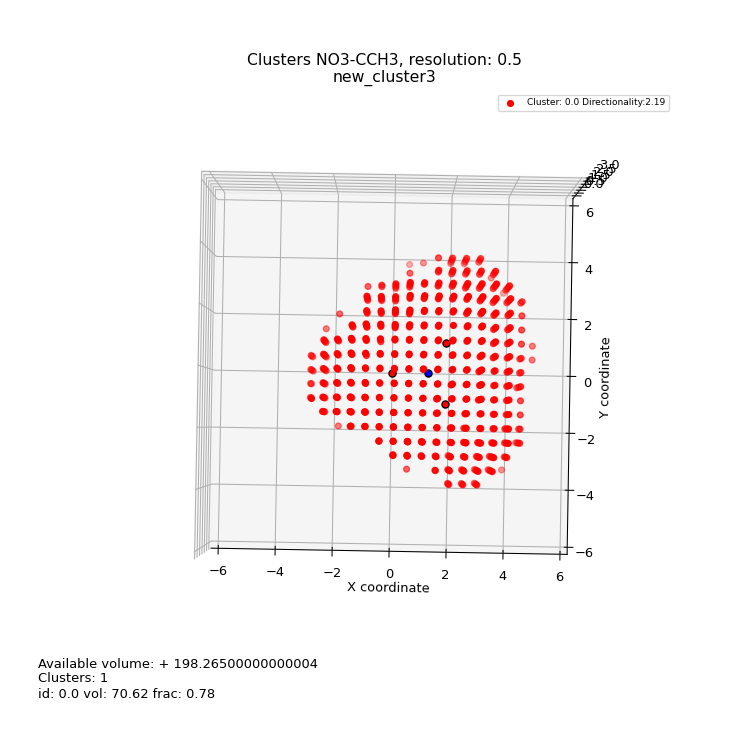

[0.]
NO3 C2CH2
.\results\NO3\NO3_C2CH2_vdw.5\NO3_C2CH2_density.hdf H05
      xstart    ystart  zstart     H
1788    0.75 -1.184211     2.6  24.0
Threshold k-means: 6.0 max_bin: 24.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 24.0 fraction for this bin:  6.0
Added 330 new bins
Added 0 new bins
Available volume: 198.19400000000005


<IPython.core.display.Javascript object>


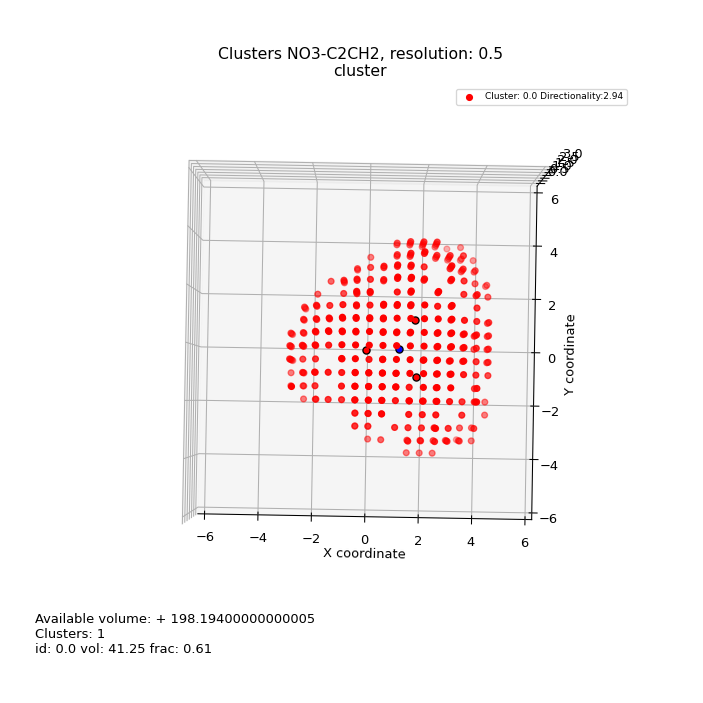

[0.]
Added another: 138
Dit is de lijst van alex: 256
Added another: 54
Dit is de lijst van alex: 129
Added another: 39
Dit is de lijst van alex: 92
Added another: 32
Dit is de lijst van alex: 78
Added another: 30
Dit is de lijst van alex: 69
Added another: 26
Dit is de lijst van alex: 55
Added another: 25
Dit is de lijst van alex: 50
Added another: 20
Dit is de lijst van alex: 34
Added another: 12
Dit is de lijst van alex: 21
Added another: 12
Dit is de lijst van alex: 20
Added another: 13
Dit is de lijst van alex: 22
Added another: 12
Dit is de lijst van alex: 20
Added another: 12
Dit is de lijst van alex: 21
Added another: 12
Dit is de lijst van alex: 22
Added another: 12
Dit is de lijst van alex: 23
Added another: 11
Dit is de lijst van alex: 22
Added another: 10
Dit is de lijst van alex: 20
Added another: 9
Dit is de lijst van alex: 18
Added another: 6
Dit is de lijst van alex: 12
Added another: 6
Dit is de lijst van alex: 11
Added another: 3
Dit is de lijst van alex: 5
Added anot

<IPython.core.display.Javascript object>


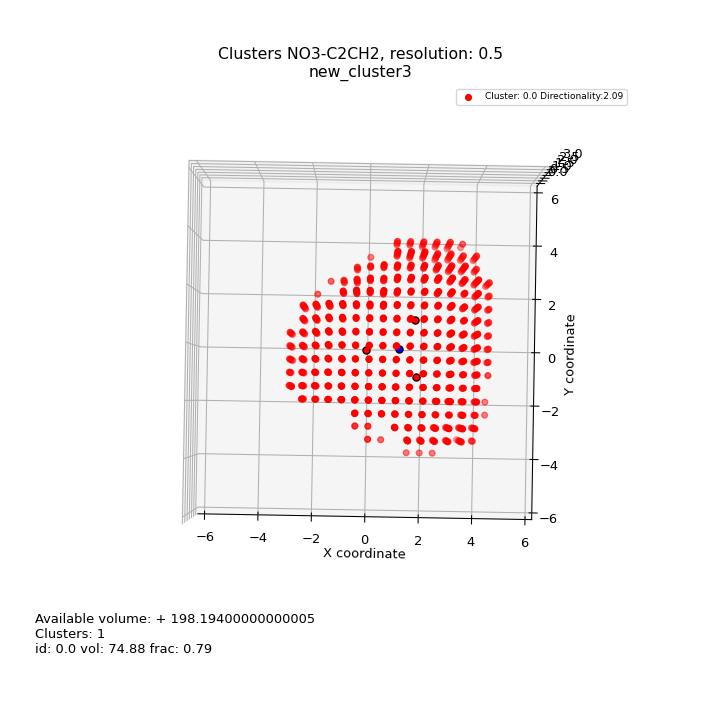

[0.]
NO3 RC6H5
.\results\NO3\NO3_RC6H5_vdw.5\NO3_RC6H5_density.hdf centroid05
      xstart    ystart    zstart  centroid
3910    0.28  0.730769  4.115385      18.0
4561    1.24 -0.230769  4.576923      18.0
Threshold k-means: 4.5 max_bin: 18.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 18.0 fraction for this bin:  4.5
Added 390 new bins
Added 0 new bins
Available volume: 1907.0230000000004


<IPython.core.display.Javascript object>


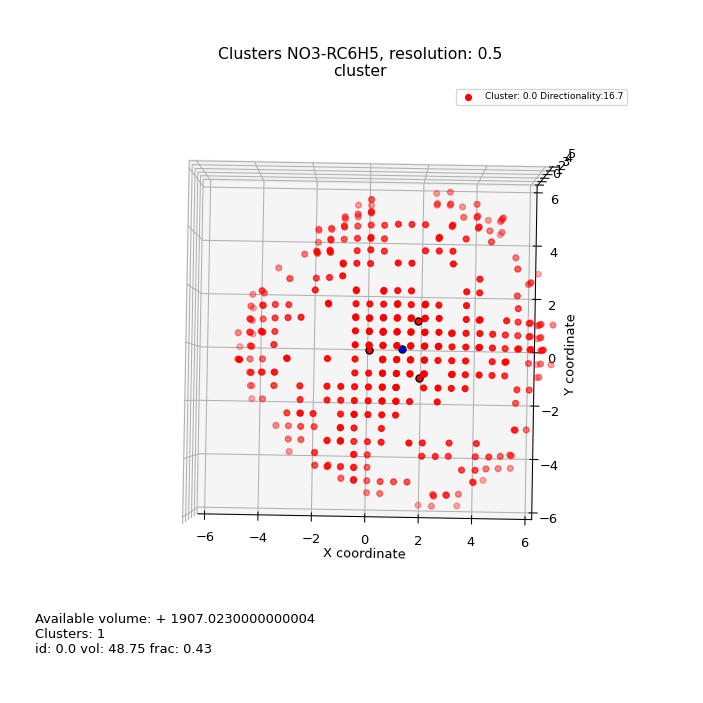

[0.]
Added another: 107
Dit is de lijst van alex: 240
Added another: 25
Dit is de lijst van alex: 68
Added another: 18
Dit is de lijst van alex: 49
Added another: 12
Dit is de lijst van alex: 32
Added another: 12
Dit is de lijst van alex: 31
Added another: 11
Dit is de lijst van alex: 24
Added another: 10
Dit is de lijst van alex: 22
Added another: 8
Dit is de lijst van alex: 21
Added another: 5
Dit is de lijst van alex: 13
Added another: 3
Dit is de lijst van alex: 9
Added another: 2
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


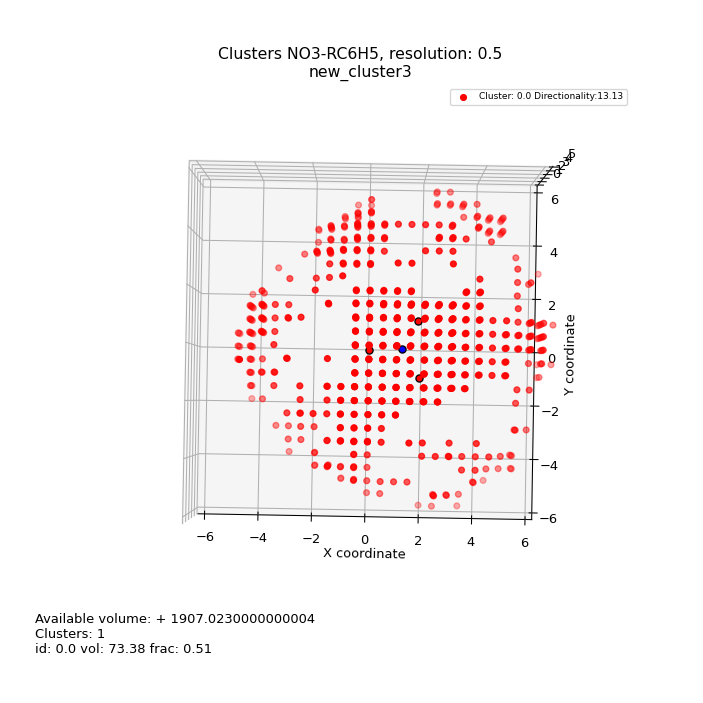

[0.]
NO3 ArCH
.\results\NO3\NO3_ArCH_vdw.5\NO3_ArCH_density.hdf H05
        xstart    ystart    zstart     H
2132  0.263158 -1.657895  2.166667  43.0
Threshold k-means: 10.75 max_bin: 43.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 43.0 fraction for this bin:  10.75
Added 319 new bins
Added 0 new bins
Available volume: 198.13000000000005


<IPython.core.display.Javascript object>


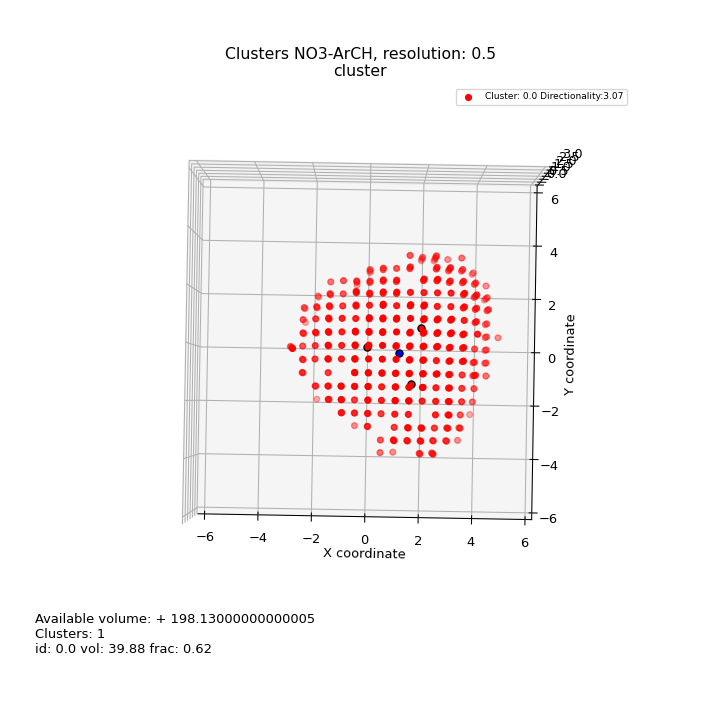

[0.]
Added another: 146
Dit is de lijst van alex: 268
Added another: 63
Dit is de lijst van alex: 135
Added another: 57
Dit is de lijst van alex: 115
Added another: 48
Dit is de lijst van alex: 83
Added another: 30
Dit is de lijst van alex: 60
Added another: 25
Dit is de lijst van alex: 48
Added another: 23
Dit is de lijst van alex: 45
Added another: 18
Dit is de lijst van alex: 33
Added another: 15
Dit is de lijst van alex: 29
Added another: 14
Dit is de lijst van alex: 22
Added another: 10
Dit is de lijst van alex: 13
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 2
Dit is de lijst van alex: 4
Added another: 1
Dit is de lijst van alex: 2
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is 

<IPython.core.display.Javascript object>


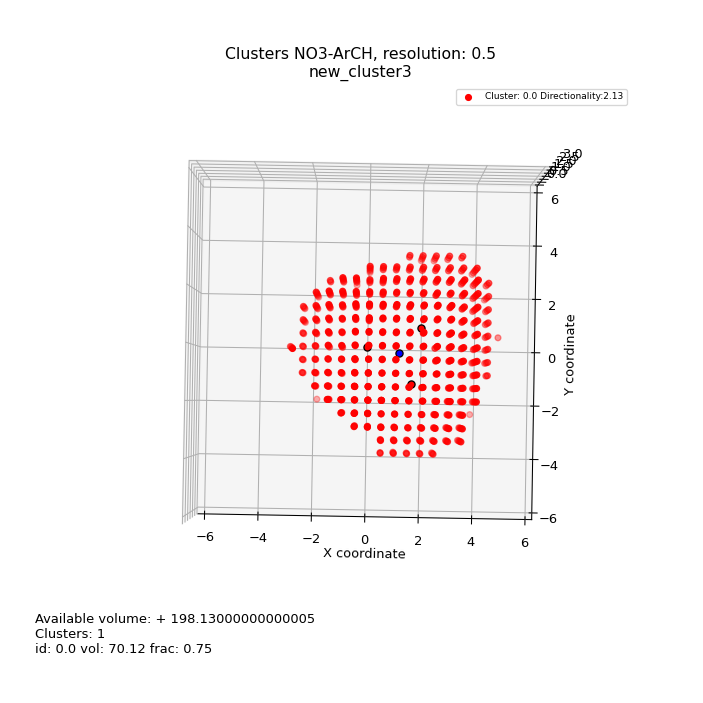

[0.]
RC6F5 CF
.\results\RC6F5\RC6F5_CF_vdw.5\RC6F5_CF_density.hdf F05
        xstart    ystart    zstart      F
4402  2.296296  2.172414  2.692308  655.0
Threshold k-means: 163.75 max_bin: 655.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 655.0 fraction for this bin:  163.75
Added 493 new bins
Added 0 new bins
Available volume: 471.73350000000016


<IPython.core.display.Javascript object>

[0.]
Added another: 198
Dit is de lijst van alex: 347
Added another: 119
Dit is de lijst van alex: 207
Added another: 95
Dit is de lijst van alex: 154
Added another: 84
Dit is de lijst van alex: 136
Added another: 69
Dit is de lijst van alex: 114
Added another: 53
Dit is de lijst van alex: 89
Added another: 35
Dit is de lijst van alex: 68
Added another: 25
Dit is de lijst van alex: 52
Added another: 16
Dit is de lijst van alex: 33
Added another: 12
Dit is de lijst van alex: 25
Added another: 9
Dit is de lijst van alex: 19
Added another: 8
Dit is de lijst van alex: 17
Added another: 8
Dit is de lijst van alex: 17
Added another: 8
Dit is de lijst van alex: 17
Added another: 8
Dit is de lijst van alex: 17
Added another: 8
Dit is de lijst van alex: 17
Added another: 8
Dit is de lijst van alex: 17
Added another: 7
Dit is de lijst van alex: 15
Added another: 6
Dit is de lijst van alex: 12
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 5
Added another:

<IPython.core.display.Javascript object>

[0.]
RC6F5 RCN
.\results\RC6F5\RC6F5_RCN_vdw.5\RC6F5_RCN_density.hdf N05
        xstart    ystart    zstart    N
3429  3.270833  0.240741  3.136364  9.0
3704  3.750000 -0.722222  3.136364  9.0
Threshold k-means: 2.25 max_bin: 9.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 9.0 fraction for this bin:  2.25
Added 73 new bins
Added 0 new bins
Available volume: 501.78400000000016


<IPython.core.display.Javascript object>

[0.]
Added another: 23
Dit is de lijst van alex: 49
Added another: 6
Dit is de lijst van alex: 14
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 4
Added another: 1
Dit is de lijst van alex: 2
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6F5 R2CO
.\results\RC6F5\RC6F5_R2CO_vdw.5\RC6F5_R2CO_density.hdf O05
        xstart    ystart    zstart     O
3791  2.777778 -2.642857  2.681818  17.0
Threshold k-means: 4.25 max_bin: 17.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 17.0 fraction for this bin:  4.25
Added 90 new bins
Added 0 new bins
Available volume: 491.50150000000014


<IPython.core.display.Javascript object>

[0.]
Added another: 30
Dit is de lijst van alex: 67
Added another: 5
Dit is de lijst van alex: 14
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6F5 XH
.\results\RC6F5\RC6F5_XH_vdw.5\RC6F5_XH_density.hdf H05
      xstart    ystart    zstart     H
1068   -1.06  2.634615 -0.045455  15.0
Threshold k-means: 3.75 max_bin: 15.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 15.0 fraction for this bin:  3.75
Added 335 new bins
Added 0 new bins
Available volume: 346.1790000000001


<IPython.core.display.Javascript object>


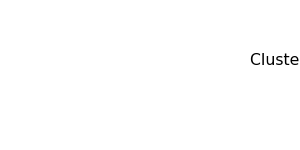

[0.]
Added another: 142
Dit is de lijst van alex: 258
Added another: 58
Dit is de lijst van alex: 127
Added another: 41
Dit is de lijst van alex: 89
Added another: 31
Dit is de lijst van alex: 69
Added another: 26
Dit is de lijst van alex: 62
Added another: 12
Dit is de lijst van alex: 32
Added another: 4
Dit is de lijst van alex: 11
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 5
Added another: 3
Dit is de lijst van alex: 7
Added another: 5
Dit is de lijst van alex: 11
Added another: 5
Dit is de lijst van alex: 11
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


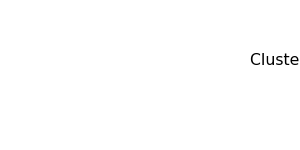

[0.]
RC6F5 XH
.\results\RC6F5\RC6F5_XH_vdw.5\RC6F5_XH_density.hdf O05
       xstart  ystart  zstart     O
541 -1.045455   -4.08   -0.05  22.0
Threshold k-means: 5.5 max_bin: 22.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 22.0 fraction for this bin:  5.5
Added 27 new bins
Added 0 new bins
Available volume: 491.4140000000001


<IPython.core.display.Javascript object>


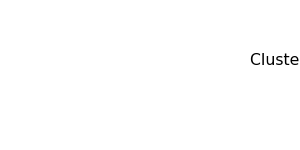

[0.]
Added another: 1
Dit is de lijst van alex: 2
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


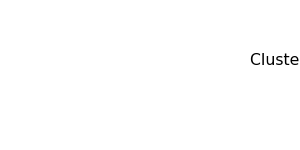

[0.]
RC6F5 CCH3
.\results\RC6F5\RC6F5_CCH3_vdw.5\RC6F5_CCH3_density.hdf H05
        xstart    ystart  zstart      H
2447  2.782609 -3.583333    2.15  164.0
Threshold k-means: 41.0 max_bin: 164.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 164.0 fraction for this bin:  41.0
Added 552 new bins
Added 0 new bins
Available volume: 344.0345000000001


<IPython.core.display.Javascript object>


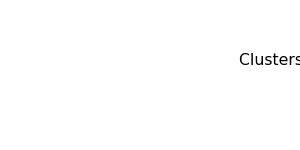

[0.]
Added another: 243
Dit is de lijst van alex: 417
Added another: 118
Dit is de lijst van alex: 199
Added another: 95
Dit is de lijst van alex: 161
Added another: 84
Dit is de lijst van alex: 134
Added another: 82
Dit is de lijst van alex: 124
Added another: 73
Dit is de lijst van alex: 113
Added another: 68
Dit is de lijst van alex: 103
Added another: 66
Dit is de lijst van alex: 102
Added another: 66
Dit is de lijst van alex: 92
Added another: 68
Dit is de lijst van alex: 92
Added another: 58
Dit is de lijst van alex: 87
Added another: 36
Dit is de lijst van alex: 63
Added another: 21
Dit is de lijst van alex: 39
Added another: 12
Dit is de lijst van alex: 24
Added another: 8
Dit is de lijst van alex: 17
Added another: 7
Dit is de lijst van alex: 15
Added another: 7
Dit is de lijst van alex: 15
Added another: 7
Dit is de lijst van alex: 15
Added another: 6
Dit is de lijst van alex: 13
Added another: 4
Dit is de lijst van alex: 8
Added another: 3
Dit is de lijst van alex: 6
Added a

<IPython.core.display.Javascript object>


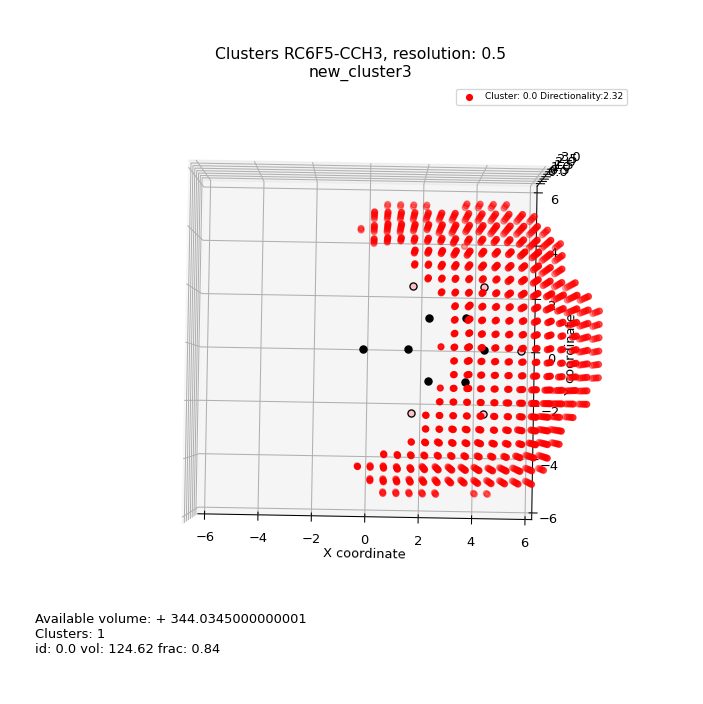

[0.]
RC6F5 C2CH2
.\results\RC6F5\RC6F5_C2CH2_vdw.5\RC6F5_C2CH2_density.hdf H05
      xstart    ystart    zstart     H
3033    3.28 -0.229167  2.636364  55.0
Threshold k-means: 13.75 max_bin: 55.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 55.0 fraction for this bin:  13.75
Added 578 new bins
Added 0 new bins
Available volume: 344.5435000000001


<IPython.core.display.Javascript object>


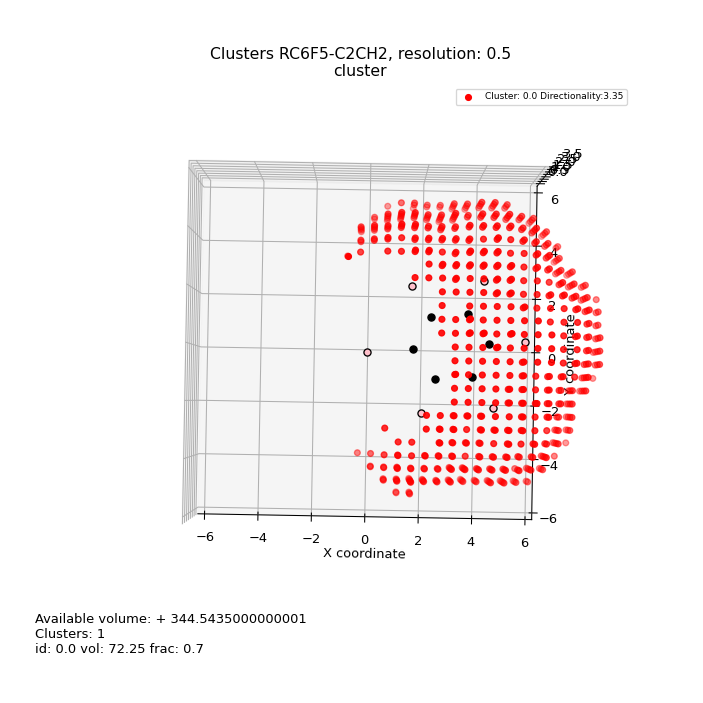

[0.]
Added another: 266
Dit is de lijst van alex: 444
Added another: 132
Dit is de lijst van alex: 245
Added another: 94
Dit is de lijst van alex: 178
Added another: 87
Dit is de lijst van alex: 153
Added another: 78
Dit is de lijst van alex: 137
Added another: 75
Dit is de lijst van alex: 128
Added another: 72
Dit is de lijst van alex: 112
Added another: 68
Dit is de lijst van alex: 103
Added another: 64
Dit is de lijst van alex: 100
Added another: 57
Dit is de lijst van alex: 89
Added another: 46
Dit is de lijst van alex: 75
Added another: 29
Dit is de lijst van alex: 54
Added another: 13
Dit is de lijst van alex: 27
Added another: 11
Dit is de lijst van alex: 25
Added another: 6
Dit is de lijst van alex: 13
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6F5 RC6H5
.\results\RC6F5\RC6F5_RC6H5_vdw.5\RC6F5_RC6H5_density.hdf centroid05
         xstart    ystart    zstart  centroid
7067   4.225806  0.241935  3.192308      53.0
10365  8.096774  3.145161  1.346154      53.0
Threshold k-means: 13.25 max_bin: 53.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 53.0 fraction for this bin:  13.25
Added 653 new bins
Added 0 new bins
Available volume: 4770.036500000002


<IPython.core.display.Javascript object>

[0.]
Added another: 219
Dit is de lijst van alex: 425
Added another: 80
Dit is de lijst van alex: 182
Added another: 58
Dit is de lijst van alex: 136
Added another: 34
Dit is de lijst van alex: 83
Added another: 14
Dit is de lijst van alex: 38
Added another: 5
Dit is de lijst van alex: 14
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6F5 ArCH
.\results\RC6F5\RC6F5_ArCH_vdw.5\RC6F5_ArCH_density.hdf H05
        xstart    ystart    zstart      H
4349  2.769231  4.076923  1.230769  126.0
Threshold k-means: 31.5 max_bin: 126.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 126.0 fraction for this bin:  31.5
Added 594 new bins
Added 0 new bins
Available volume: 344.61050000000006


<IPython.core.display.Javascript object>

[0.]
Added another: 273
Dit is de lijst van alex: 427
Added another: 135
Dit is de lijst van alex: 244
Added another: 98
Dit is de lijst van alex: 180
Added another: 78
Dit is de lijst van alex: 145
Added another: 82
Dit is de lijst van alex: 138
Added another: 72
Dit is de lijst van alex: 120
Added another: 60
Dit is de lijst van alex: 95
Added another: 56
Dit is de lijst van alex: 88
Added another: 59
Dit is de lijst van alex: 87
Added another: 54
Dit is de lijst van alex: 78
Added another: 44
Dit is de lijst van alex: 71
Added another: 27
Dit is de lijst van alex: 49
Added another: 13
Dit is de lijst van alex: 25
Added another: 4
Dit is de lijst van alex: 9
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
H2O CF
.\results\H2O\H2O_CF_vdw.5\H2O_CF_density.hdf F05
        xstart    ystart    zstart     F
2188 -0.681818  2.166667  1.333333  21.0
Threshold k-means: 5.25 max_bin: 21.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 21.0 fraction for this bin:  5.25
Added 224 new bins
Added 0 new bins
Available volume: 182.29200000000003


<IPython.core.display.Javascript object>

[0.]
Added another: 114
Dit is de lijst van alex: 202
Added another: 63
Dit is de lijst van alex: 116
Added another: 45
Dit is de lijst van alex: 86
Added another: 27
Dit is de lijst van alex: 54
Added another: 10
Dit is de lijst van alex: 23
Added another: 6
Dit is de lijst van alex: 15
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 2
Dit is de lijst van alex: 5
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
H2O RCN
.\results\H2O\H2O_RCN_vdw.5\H2O_RCN_density.hdf N05
        xstart    ystart    zstart      N
2520  1.684211  2.138889 -0.045455  383.0
Threshold k-means: 95.75 max_bin: 383.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 383.0 fraction for this bin:  95.75
Added 11 new bins
Added 0 new bins
Available volume: 196.24700000000004


<IPython.core.display.Javascript object>


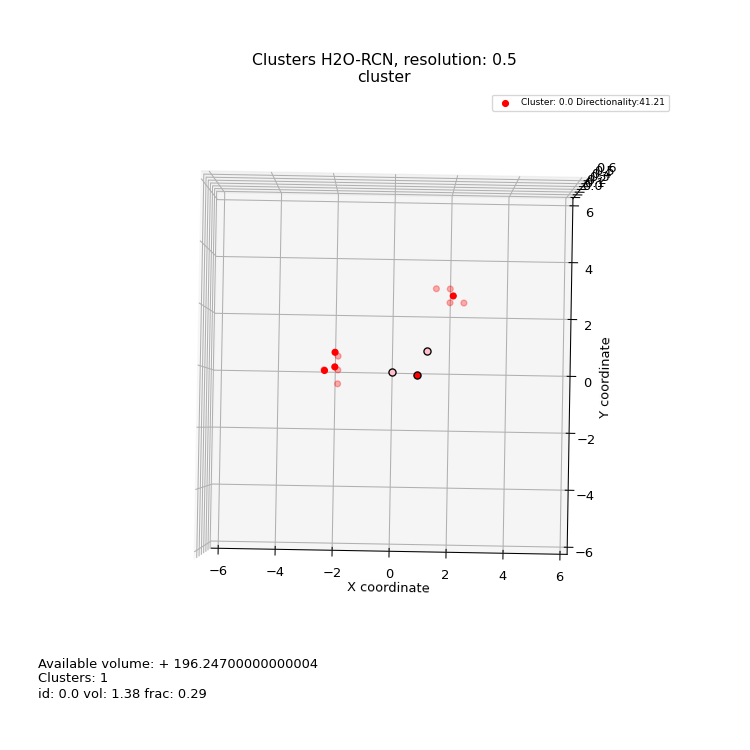

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


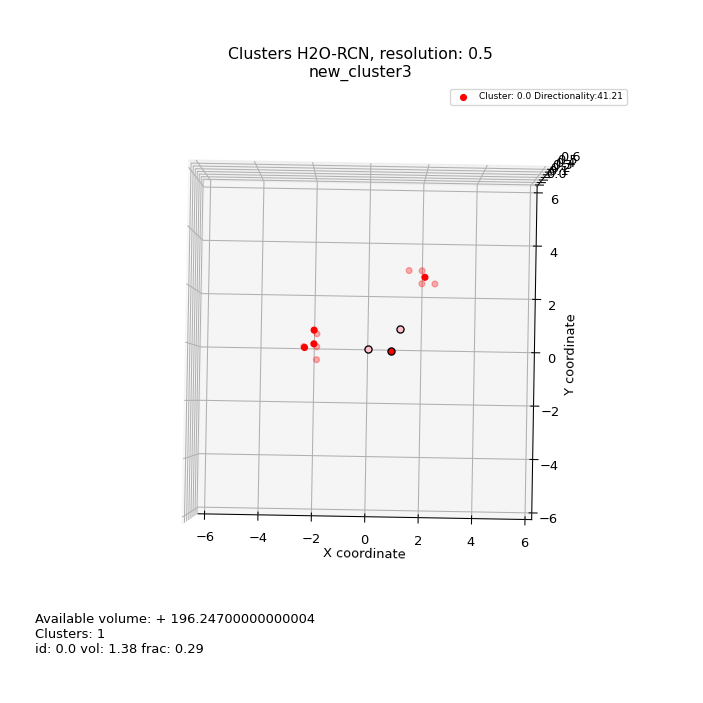

[0.]
H2O R2CO
.\results\H2O\H2O_R2CO_vdw.5\H2O_R2CO_density.hdf O05
        xstart    ystart    zstart       O
1441 -2.113636 -0.227273 -0.041667  5486.0
Threshold k-means: 1371.5 max_bin: 5486.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 5486.0 fraction for this bin:  1371.5
Added 15 new bins
Added 0 new bins
Available volume: 190.77900000000005


<IPython.core.display.Javascript object>

[0.]
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


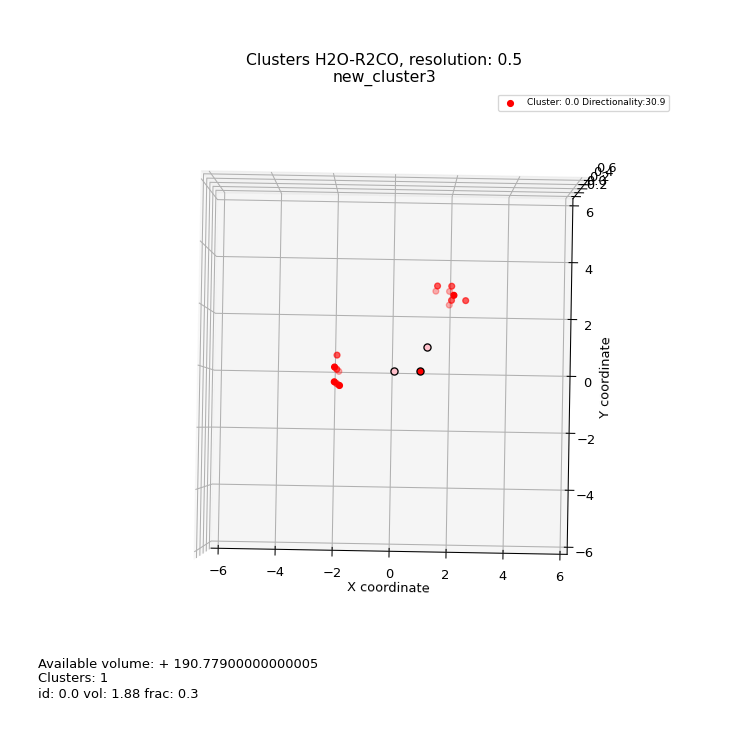

[0.]
H2O XH
.\results\H2O\H2O_XH_vdw.5\H2O_XH_density.hdf H05
      xstart    ystart    zstart        H
2897   1.225 -1.217391  1.318182  12446.0
Threshold k-means: 3111.5 max_bin: 12446.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 12446.0 fraction for this bin:  3111.5
Added 17 new bins
Added 0 new bins
Available volume: 125.39300000000003


<IPython.core.display.Javascript object>


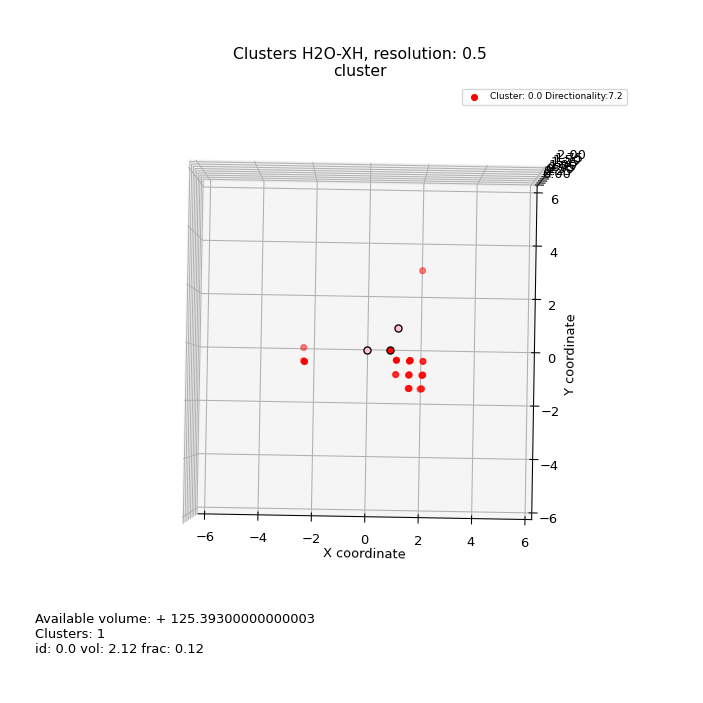

[0.]
Added another: 2
Dit is de lijst van alex: 6
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


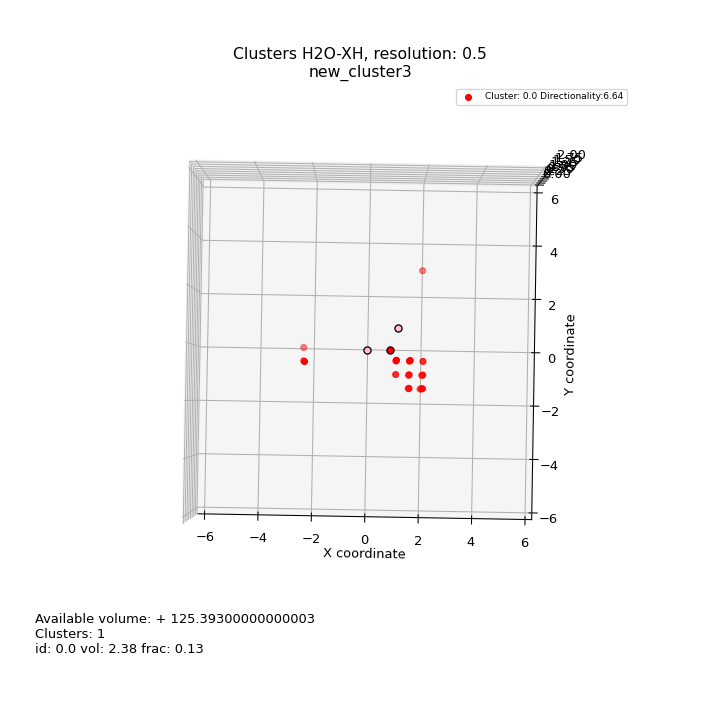

[0.]
H2O XH
.\results\H2O\H2O_XH_vdw.5\H2O_XH_density.hdf O05
        xstart   ystart  zstart        O
1041 -2.105263 -0.26087   -0.05  12447.0
Threshold k-means: 3111.75 max_bin: 12447.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 12447.0 fraction for this bin:  3111.75
Added 28 new bins
Added 0 new bins
Available volume: 190.69900000000004


<IPython.core.display.Javascript object>


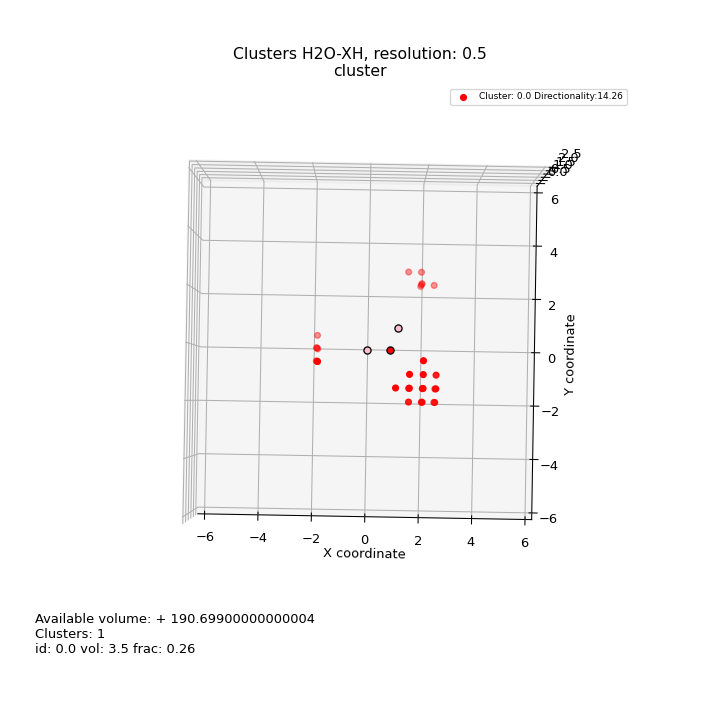

[0.]
Added another: 3
Dit is de lijst van alex: 8
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


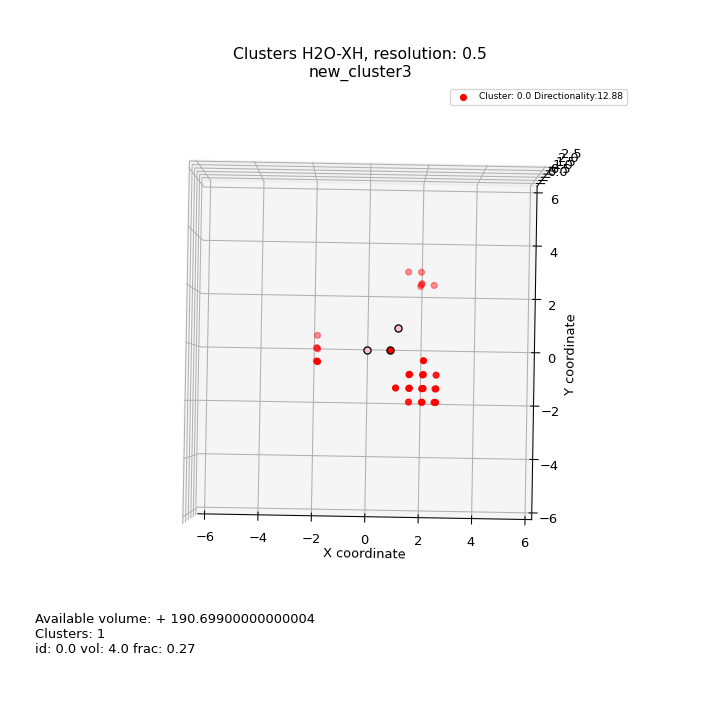

[0.]
H2O CCH3
.\results\H2O\H2O_CCH3_vdw.5\H2O_CCH3_density.hdf H05
       xstart   ystart    zstart      H
810 -1.133333  0.71875  2.181818  141.0
Threshold k-means: 35.25 max_bin: 141.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 141.0 fraction for this bin:  35.25
Added 280 new bins
Added 0 new bins
Available volume: 125.76800000000004


<IPython.core.display.Javascript object>


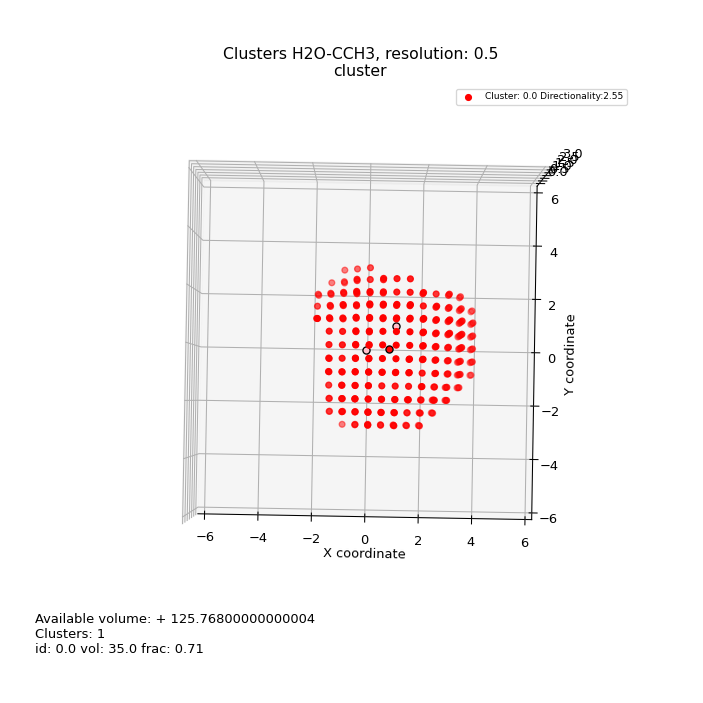

[0.]
Added another: 112
Dit is de lijst van alex: 191
Added another: 50
Dit is de lijst van alex: 88
Added another: 36
Dit is de lijst van alex: 58
Added another: 25
Dit is de lijst van alex: 44
Added another: 21
Dit is de lijst van alex: 39
Added another: 19
Dit is de lijst van alex: 32
Added another: 21
Dit is de lijst van alex: 33
Added another: 24
Dit is de lijst van alex: 37
Added another: 24
Dit is de lijst van alex: 35
Added another: 19
Dit is de lijst van alex: 29
Added another: 14
Dit is de lijst van alex: 24
Added another: 8
Dit is de lijst van alex: 15
Added another: 7
Dit is de lijst van alex: 17
Added another: 5
Dit is de lijst van alex: 13
Added another: 5
Dit is de lijst van alex: 13
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


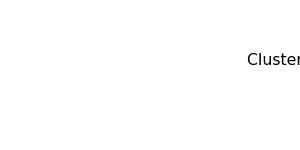

[0.]
H2O C2CH2
.\results\H2O\H2O_C2CH2_vdw.5\H2O_C2CH2_density.hdf H05
        xstart    ystart    zstart      H
1603 -0.222222  0.235294  2.636364  131.0
Threshold k-means: 32.75 max_bin: 131.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 131.0 fraction for this bin:  32.75
Added 286 new bins
Added 0 new bins
Available volume: 125.64300000000003


<IPython.core.display.Javascript object>


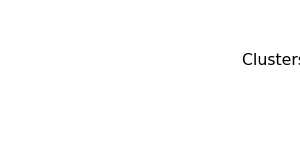

[0.]
Added another: 111
Dit is de lijst van alex: 183
Added another: 53
Dit is de lijst van alex: 92
Added another: 29
Dit is de lijst van alex: 47
Added another: 23
Dit is de lijst van alex: 42
Added another: 16
Dit is de lijst van alex: 26
Added another: 19
Dit is de lijst van alex: 31
Added another: 21
Dit is de lijst van alex: 32
Added another: 21
Dit is de lijst van alex: 31
Added another: 21
Dit is de lijst van alex: 33
Added another: 17
Dit is de lijst van alex: 30
Added another: 10
Dit is de lijst van alex: 20
Added another: 8
Dit is de lijst van alex: 18
Added another: 6
Dit is de lijst van alex: 15
Added another: 4
Dit is de lijst van alex: 10
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 6
Added another: 2
Dit is de lijst van alex: 6
Added another: 3
Dit is de lijst van alex: 8
Added another: 3
Dit is de lijst van alex: 8
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


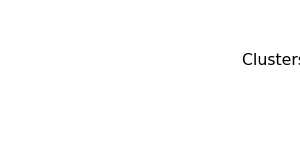

[0.]
H2O RC6H5
.\results\H2O\H2O_RC6H5_vdw.5\H2O_RC6H5_density.hdf centroid05
      xstart    ystart    zstart  centroid
3000 -0.6875  1.208333  4.115385      49.0
Threshold k-means: 12.25 max_bin: 49.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 49.0 fraction for this bin:  12.25
Added 472 new bins
Added 0 new bins
Available volume: 1059.0180000000003


<IPython.core.display.Javascript object>


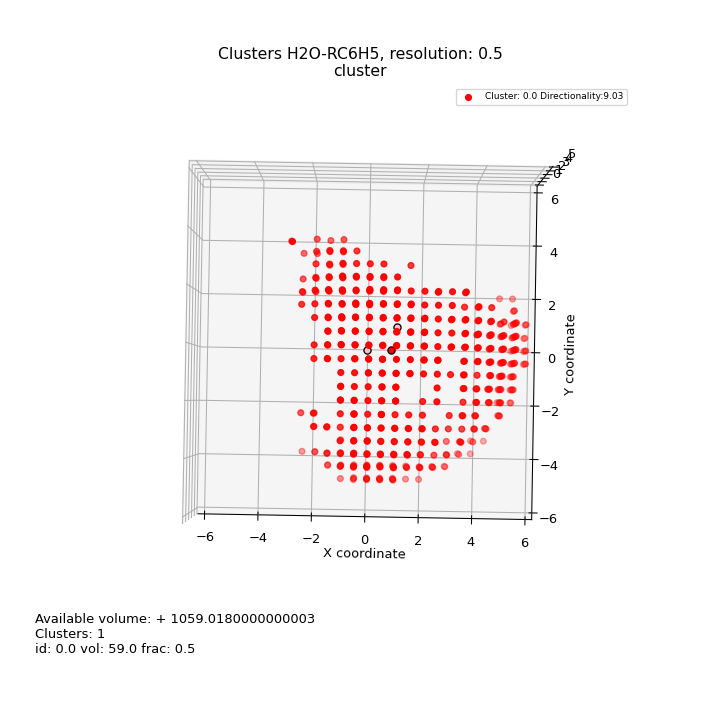

[0.]
Added another: 155
Dit is de lijst van alex: 293
Added another: 50
Dit is de lijst van alex: 124
Added another: 38
Dit is de lijst van alex: 93
Added another: 26
Dit is de lijst van alex: 64
Added another: 16
Dit is de lijst van alex: 39
Added another: 11
Dit is de lijst van alex: 27
Added another: 8
Dit is de lijst van alex: 20
Added another: 6
Dit is de lijst van alex: 14
Added another: 6
Dit is de lijst van alex: 14
Added another: 5
Dit is de lijst van alex: 11
Added another: 5
Dit is de lijst van alex: 11
Added another: 3
Dit is de lijst van alex: 8
Added another: 3
Dit is de lijst van alex: 9
Added another: 3
Dit is de lijst van alex: 8
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
H2O ArCH
.\results\H2O\H2O_ArCH_vdw.5\H2O_ArCH_density.hdf H05
        xstart    ystart    zstart      H
1543 -0.666667  0.722222  2.153846  139.0
Threshold k-means: 34.75 max_bin: 139.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 139.0 fraction for this bin:  34.75
Added 269 new bins
Added 0 new bins
Available volume: 125.69600000000003


<IPython.core.display.Javascript object>

[0.]
Added another: 127
Dit is de lijst van alex: 195
Added another: 36
Dit is de lijst van alex: 78
Added another: 30
Dit is de lijst van alex: 57
Added another: 23
Dit is de lijst van alex: 42
Added another: 22
Dit is de lijst van alex: 36
Added another: 21
Dit is de lijst van alex: 36
Added another: 21
Dit is de lijst van alex: 36
Added another: 21
Dit is de lijst van alex: 35
Added another: 21
Dit is de lijst van alex: 36
Added another: 13
Dit is de lijst van alex: 28
Added another: 6
Dit is de lijst van alex: 15
Added another: 5
Dit is de lijst van alex: 12
Added another: 3
Dit is de lijst van alex: 7
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6H5 CF
.\results\RC6H5\RC6H5_CF_vdw.5\RC6H5_CF_density.hdf F05
        xstart    ystart    zstart      F
8174  5.589286  0.258621  0.416667  617.0
Threshold k-means: 154.25 max_bin: 617.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 617.0 fraction for this bin:  154.25
Added 412 new bins
Added 0 new bins
Available volume: 368.8470000000001


<IPython.core.display.Javascript object>

[0.]
Added another: 214
Dit is de lijst van alex: 332
Added another: 134
Dit is de lijst van alex: 214
Added another: 99
Dit is de lijst van alex: 147
Added another: 70
Dit is de lijst van alex: 111
Added another: 46
Dit is de lijst van alex: 77
Added another: 26
Dit is de lijst van alex: 47
Added another: 13
Dit is de lijst van alex: 27
Added another: 5
Dit is de lijst van alex: 12
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6H5 RCN
.\results\RC6H5\RC6H5_RCN_vdw.5\RC6H5_RCN_density.hdf N05
        xstart    ystart    zstart      N
5558  3.185185  4.596154  0.416667  262.0
Threshold k-means: 65.5 max_bin: 262.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 262.0 fraction for this bin:  65.5
Added 227 new bins
Added 0 new bins
Available volume: 392.2325000000001


<IPython.core.display.Javascript object>

[0.]
Added another: 81
Dit is de lijst van alex: 176
Added another: 32
Dit is de lijst van alex: 79
Added another: 13
Dit is de lijst van alex: 35
Added another: 5
Dit is de lijst van alex: 14
Added another: 5
Dit is de lijst van alex: 14
Added another: 4
Dit is de lijst van alex: 11
Added another: 3
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>

[0.]
RC6H5 R2CO
.\results\RC6H5\RC6H5_R2CO_vdw.5\RC6H5_R2CO_density.hdf O05
        xstart    ystart    zstart      O
7886  5.574074  0.267857  0.416667  822.0
Threshold k-means: 205.5 max_bin: 822.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 822.0 fraction for this bin:  205.5
Added 305 new bins
Added 0 new bins
Available volume: 384.65250000000003


<IPython.core.display.Javascript object>


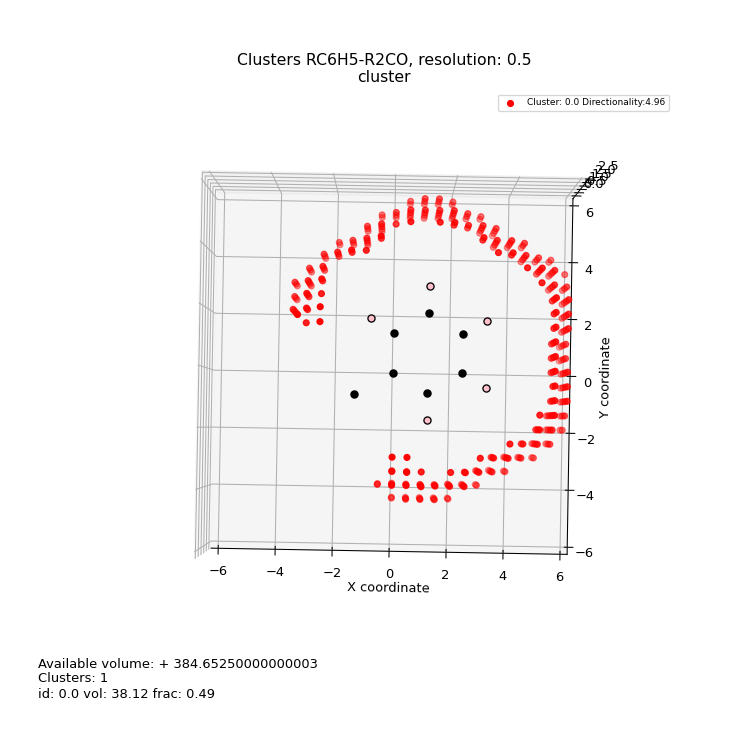

[0.]
Added another: 99
Dit is de lijst van alex: 212
Added another: 45
Dit is de lijst van alex: 105
Added another: 25
Dit is de lijst van alex: 59
Added another: 11
Dit is de lijst van alex: 27
Added another: 5
Dit is de lijst van alex: 13
Added another: 4
Dit is de lijst van alex: 10
Added another: 3
Dit is de lijst van alex: 8
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


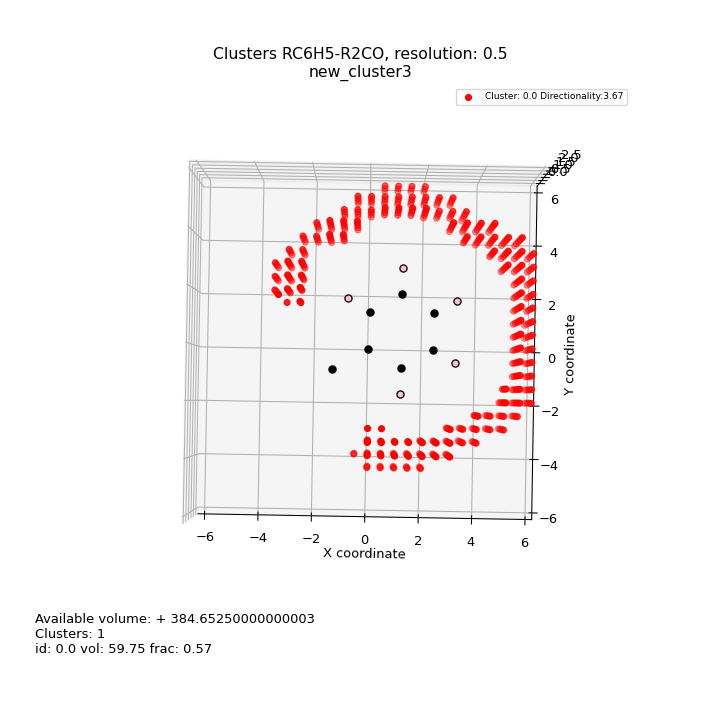

[0.]
RC6H5 XH
.\results\RC6H5\RC6H5_XH_vdw.5\RC6H5_XH_density.hdf H05
        xstart    ystart    zstart      H
5558  3.173077  4.596154  0.416667  272.0
Threshold k-means: 68.0 max_bin: 272.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 272.0 fraction for this bin:  68.0
Added 881 new bins
Added 0 new bins
Available volume: 266.44900000000007


<IPython.core.display.Javascript object>


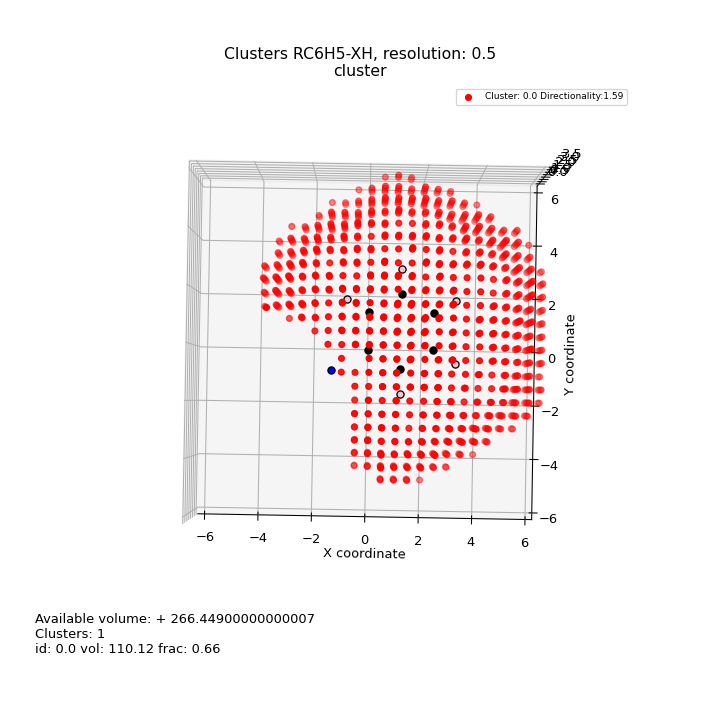

[0.]
Added another: 334
Dit is de lijst van alex: 539
Added another: 206
Dit is de lijst van alex: 345
Added another: 161
Dit is de lijst van alex: 256
Added another: 139
Dit is de lijst van alex: 193
Added another: 127
Dit is de lijst van alex: 169
Added another: 102
Dit is de lijst van alex: 134
Added another: 81
Dit is de lijst van alex: 110
Added another: 68
Dit is de lijst van alex: 96
Added another: 47
Dit is de lijst van alex: 70
Added another: 38
Dit is de lijst van alex: 53
Added another: 36
Dit is de lijst van alex: 49
Added another: 30
Dit is de lijst van alex: 41
Added another: 22
Dit is de lijst van alex: 29
Added another: 14
Dit is de lijst van alex: 21
Added another: 7
Dit is de lijst van alex: 12
Added another: 7
Dit is de lijst van alex: 12
Added another: 9
Dit is de lijst van alex: 15
Added another: 11
Dit is de lijst van alex: 18
Added another: 11
Dit is de lijst van alex: 18
Added another: 10
Dit is de lijst van alex: 18
Added another: 4
Dit is de lijst van alex: 10

<IPython.core.display.Javascript object>


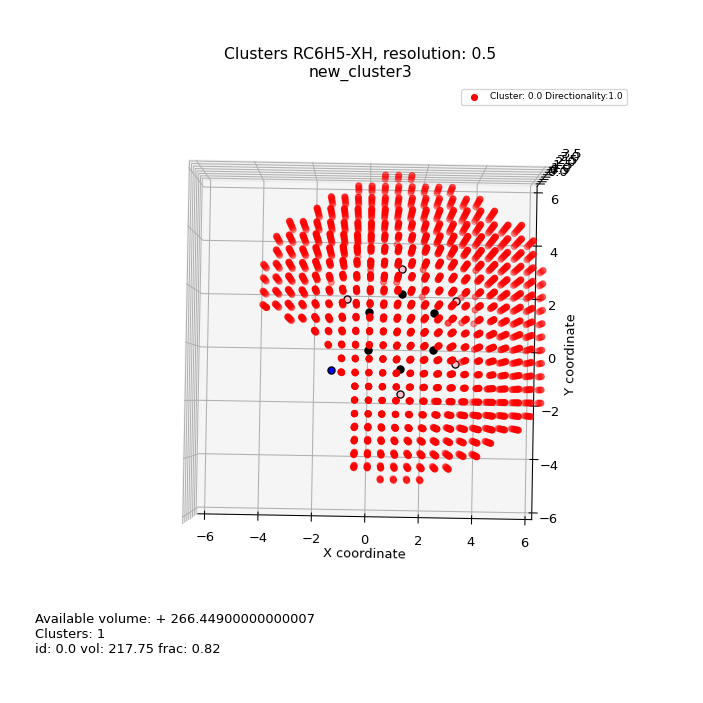

[0.]
RC6H5 XH
.\results\RC6H5\RC6H5_XH_vdw.5\RC6H5_XH_density.hdf O05
       xstart  ystart    zstart      O
728 -3.541667    2.18  0.409091  355.0
Threshold k-means: 88.75 max_bin: 355.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 355.0 fraction for this bin:  88.75
Added 363 new bins
Added 0 new bins
Available volume: 384.32500000000005


<IPython.core.display.Javascript object>


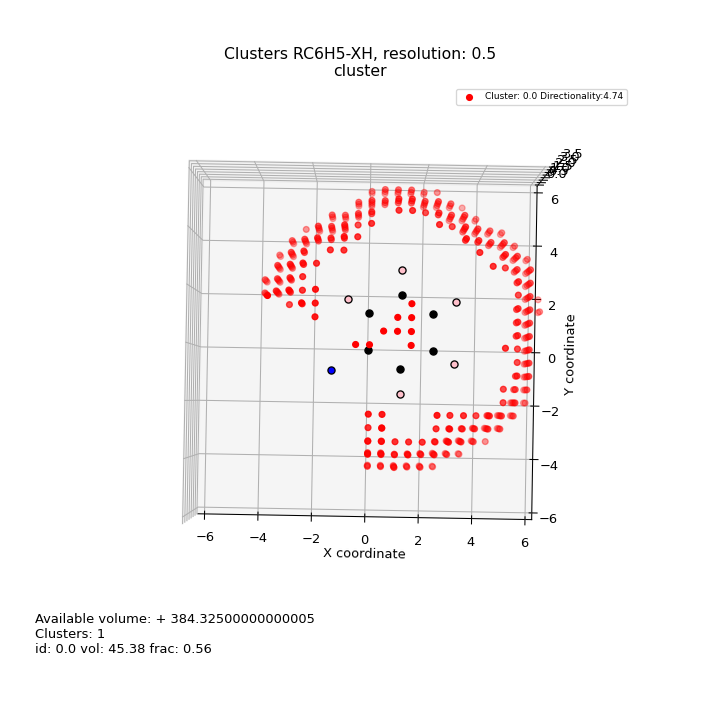

[0.]
Added another: 143
Dit is de lijst van alex: 288
Added another: 68
Dit is de lijst van alex: 152
Added another: 43
Dit is de lijst van alex: 102
Added another: 27
Dit is de lijst van alex: 62
Added another: 16
Dit is de lijst van alex: 38
Added another: 9
Dit is de lijst van alex: 22
Added another: 3
Dit is de lijst van alex: 8
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


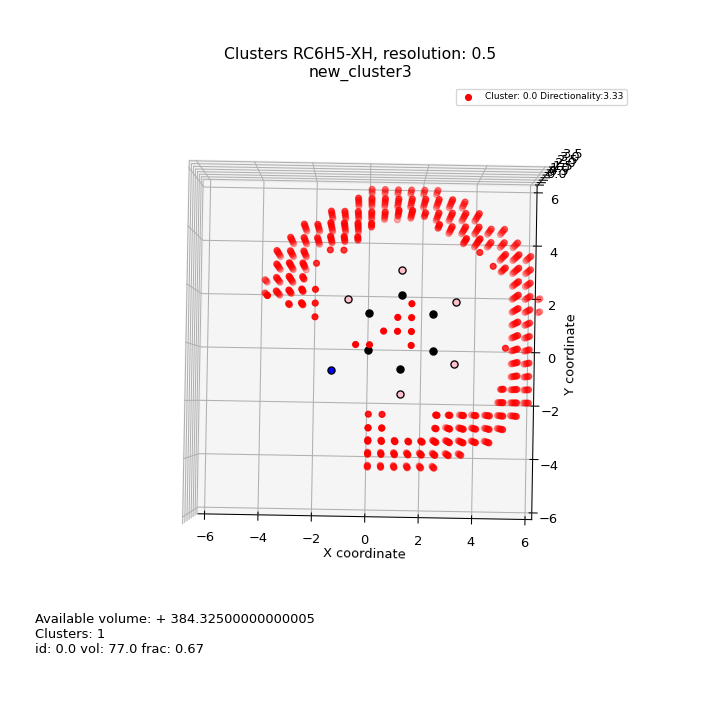

[0.]
RC6H5 CCH3
.\results\RC6H5\RC6H5_CCH3_vdw.5\RC6H5_CCH3_density.hdf H05
      xstart    ystart    zstart       H
2780    1.25  0.272727  2.636364  2750.0
Threshold k-means: 687.5 max_bin: 2750.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 2750.0 fraction for this bin:  687.5
Added 277 new bins
Added 0 new bins
Available volume: 266.44250000000005


<IPython.core.display.Javascript object>


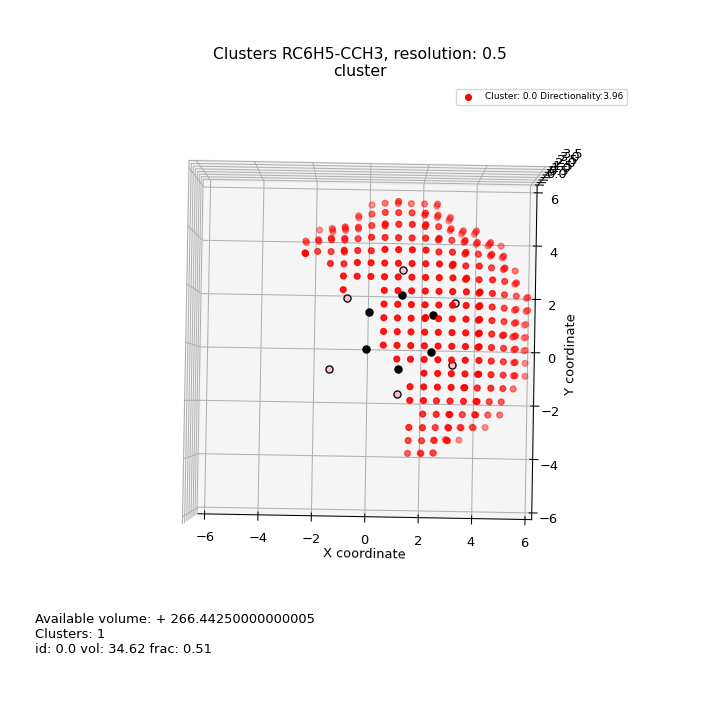

[0.]
Added another: 138
Dit is de lijst van alex: 248
Added another: 68
Dit is de lijst van alex: 141
Added another: 42
Dit is de lijst van alex: 92
Added another: 38
Dit is de lijst van alex: 74
Added another: 35
Dit is de lijst van alex: 63
Added another: 34
Dit is de lijst van alex: 58
Added another: 31
Dit is de lijst van alex: 50
Added another: 26
Dit is de lijst van alex: 45
Added another: 23
Dit is de lijst van alex: 43
Added another: 20
Dit is de lijst van alex: 40
Added another: 17
Dit is de lijst van alex: 35
Added another: 13
Dit is de lijst van alex: 28
Added another: 10
Dit is de lijst van alex: 23
Added another: 7
Dit is de lijst van alex: 17
Added another: 6
Dit is de lijst van alex: 13
Added another: 5
Dit is de lijst van alex: 11
Added another: 2
Dit is de lijst van alex: 5
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
D

<IPython.core.display.Javascript object>


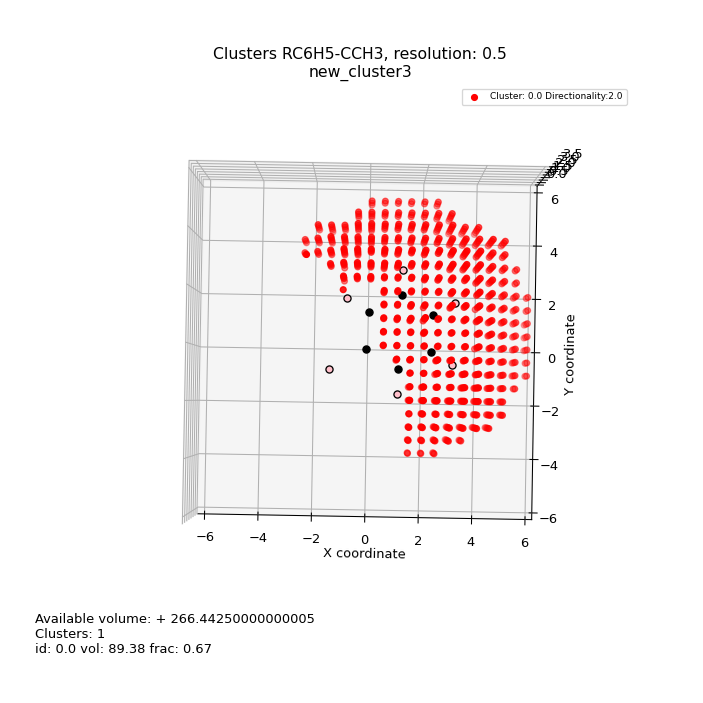

[0.]
RC6H5 C2CH2
.\results\RC6H5\RC6H5_C2CH2_vdw.5\RC6H5_C2CH2_density.hdf H05
       xstart  ystart    zstart       H
3440  1.26087    0.28  2.666667  1582.0
Threshold k-means: 395.5 max_bin: 1582.0 with fraction: 0.25

Recluster method 3
Cluster id: 0.0  max bin: 1582.0 fraction for this bin:  395.5
Added 163 new bins
Added 0 new bins
Available volume: 266.2945


<IPython.core.display.Javascript object>


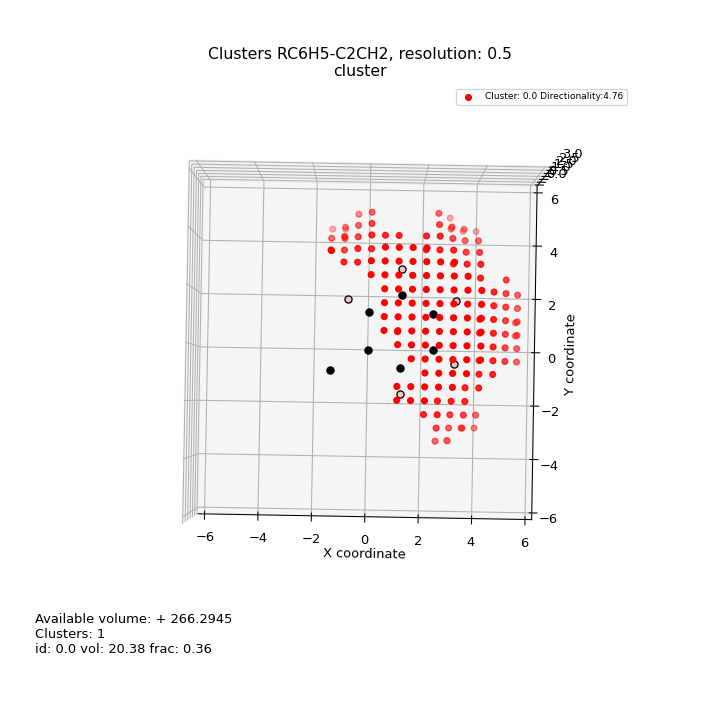

[0.]
Added another: 61
Dit is de lijst van alex: 122
Added another: 22
Dit is de lijst van alex: 51
Added another: 10
Dit is de lijst van alex: 21
Added another: 8
Dit is de lijst van alex: 16
Added another: 6
Dit is de lijst van alex: 12
Added another: 5
Dit is de lijst van alex: 10
Added another: 5
Dit is de lijst van alex: 10
Added another: 5
Dit is de lijst van alex: 11
Added another: 3
Dit is de lijst van alex: 8
Added another: 2
Dit is de lijst van alex: 6
Added another: 1
Dit is de lijst van alex: 3
Added another: 1
Dit is de lijst van alex: 3
Added another: 0
Dit is de lijst van alex: 0


<IPython.core.display.Javascript object>


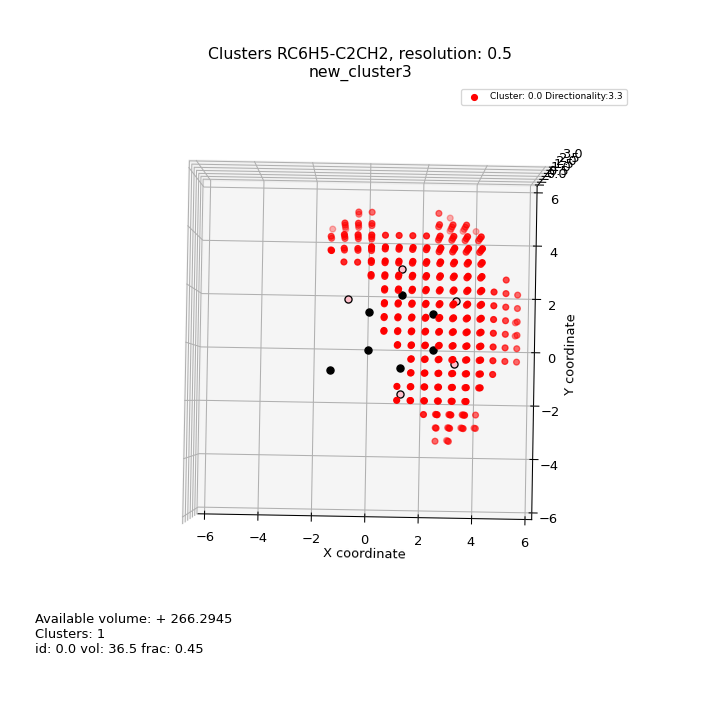

[0.]
RC6H5 RC6H5


In [16]:
central_groups = ["RCOMe", "RNO2", "ArCI", "NO3", "RC6F5", "H2O", "RC6H5"]
contact_groups = ["CF", "RCN", "R2CO", "XH", "XH", "CCH3", "C2CH2", "RC6H5", "ArCH"]  #
to_count =       ["F",   "N",    "O",   "H", "O",  "H",     "H", "centroid", "H"] #, 

if not os.path.exists('results/single_cluster_directionality/'):
    os.mkdir('results/single_cluster_directionality/')

kfrac = 0.25
recluster_frac = 0.25

resolution = 0.50

for central in central_groups:
    for contact, to_count_contact in zip(contact_groups, to_count):
        if not os.path.exists('results/single_cluster_directionality/' + central + "/"):
            os.mkdir('results/single_cluster_directionality/' + central + "/")
        
        print(central, contact)
        if central == "RC6H5" and contact == "RC6H5":
            break
            
        filename = ".\\results\\" + central + "\\" + central + "_" + contact + "_vdw.5" + "\\" + central + "_" + contact + "_vdw.5_aligned.csv"
        settings = Settings(filename)
        settings.set_atom_to_count(to_count_contact)
        settings.set_resolution(round(resolution, 2))
        
        avg_fragment = pd.read_csv(settings.get_avg_frag_filename())
        density_df = pd.read_hdf(settings.get_density_df_filename(), settings.get_density_df_key())
        print(settings.get_density_df_filename(), settings.get_density_df_key())
        
        maximum = density_df[to_count_contact].max()
        print(density_df[density_df[to_count_contact] == maximum])
         
#         make_density_plot(avg_fragment, density_df, settings)

        density_df, centroids, V_available = calc_directionality(settings=settings,
                                                                  density_df=density_df,
                                                                  k=cluster_amount, 
                                                                  kmeans_frac=kfrac,
                                                                  recluster_frac=recluster_frac)

        print("Available volume:", V_available)
        
        # cluster
        plt_name = get_cluster_plot_name(settings, 'cluster', cluster_amount)
        show_directionality(avg_fragment, density_df, 'cluster', settings, V_available, plt_name, kfrac)
                
        # recluster in method 3 and fill the holes
        plt_name = get_plot_name(settings, 'new_cluster3', cluster_amount)       
        density_df_filled_cluster = fill_holes(copy.deepcopy(density_df), settings.resolution, column='new_cluster3')
        
        plt_name = get_plot_name(settings, 'new_cluster3', cluster_amount, filledholes=True)
        show_directionality(avg_fragment, density_df_filled_cluster, 'new_cluster3', settings, V_available, plt_name, kfrac)